# Monte Carlo Tree Search

CSI 4106 Introduction to Artificial Intelligence

Marcel Turcotte  
Version: Jul 11, 2025 15:54

# Preamble

## Quote of the Day

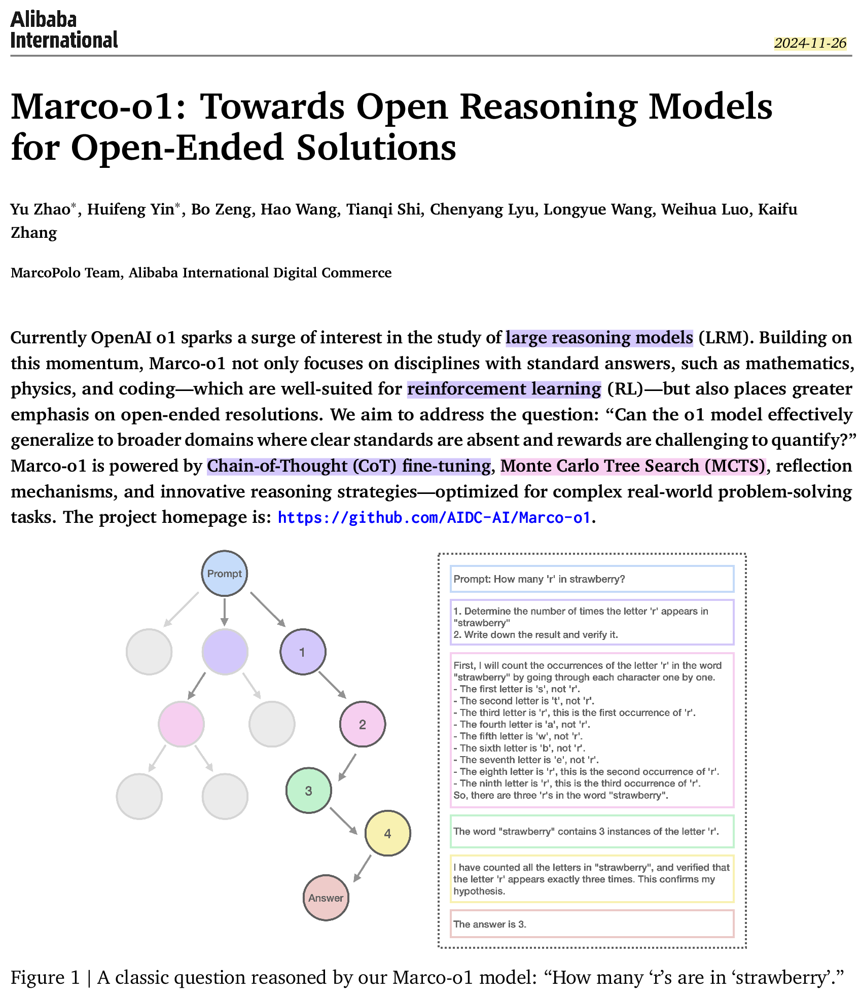

[huggingface.co/AIDC-AI/Marco-o1](https://huggingface.co/AIDC-AI/Marco-o1)
or [ollama.com/library/marco-o1](https://ollama.com/library/marco-o1)

Alibaba has recently introduced a large-scale reasoning model named
Marco-o1. This model employs Monte Carlo Tree Search (MCTS) to expand
the solution space and devise innovative reasoning strategies.

## Learning objectives

-   **Explain** the concept and key steps of Monte Carlo Tree Search
    (MCTS).
-   **Compare** MCTS with other search algorithms like BFS, DFS, A\*,
    Simulated Annealing, and Genetic Algorithms.
-   **Analyze** how MCTS balances exploration and exploitation using the
    UCB1 formula.
-   **Implement** MCTS in practical applications such as Tic-Tac-Toe.

# Introduction

## Monte Carlo Tree Search (MCTS)

In the introductory lecture on **state space search**, I used **Monte
Carlo Tree Search (MCTS)**, a key component of **AlphaGo**, to exemplify
the role of search algorithms in reasoning.

Today, we conclude this series by examining the implementation details
of this algorithm.

## Applications

-   De novo drug design
-   Electronic circuit routing
-   Load monitoring in smart grids
-   Lane keeping and overtaking tasks
-   Motion planning in autonomous driving
-   Even solving the travelling salesman problem

**See**: Kemmerling, Lütticke, and Schmitt (2024)

The paper by Kemmerling and colleagues (Kemmerling, Lütticke, and
Schmitt 2024) illustrates the wide range of applications for MCTS when
combined with deep neural networks.

## Historical Notes

-   **2008**: the algorithm is introduced in the context of **AI game**
    (Chaslot et al. 2008)
-   **2016**: the algorithm is combined with **deep neural networks** to
    create **AlphaGo** (Silver et al. 2016)

## Definition

A **Monte Carlo algorithm** is a computational method that uses **random
sampling to obtain numerical results**, often used for optimization,
numerical integration, and probability distribution estimation.

It is characterized by its ability to handle **complex problems** with
probabilistic solutions, trading **exactness** for **efficiency** and
**scalability**.

## Algorithm

1.  **Selection** (tree traversal)
2.  Node **expansion**
3.  **Rollout** (simulation)
4.  **Back-propagation**

## Algorithm

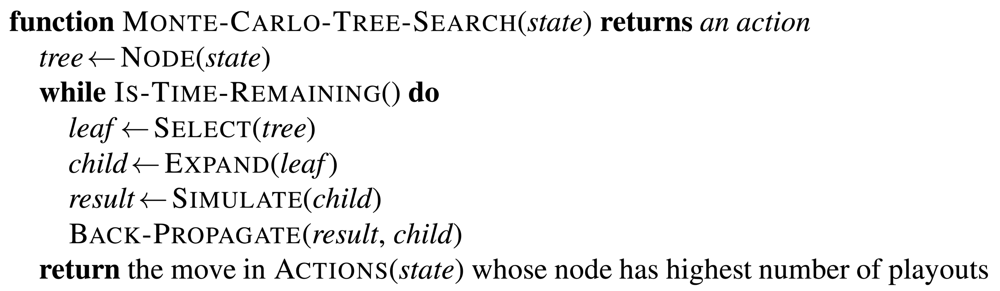

**Attribution**: Russell and Norvig (2020), Figure 5.11

## Discussion

Like other algorithms previously discussed, such as **BFS**, **DFS**,
and $A^\star$, Monte Carlo Tree Search (MCTS) maintains a **frontier**
of unexpanded nodes.

Examining the relationship between MCTS and previous search algorithms
offers valuable insights into their similarities and differences,
providing an excellent opportunity to synthesize key concepts.

## Discussion

Similar to $A^\star$, Monte Carlo Tree Search (MCTS) employs a
heuristic, referred to as a **policy**, to determine the **optimal node
for expansion**.

However, in $A^\star$, the heuristic is typically a **static** function
estimating cost to a goal, whereas in MCTS, the “policy” involves
**dynamic** evaluation.

By “static evaluation,” we mean a function that yields the same result
for a given state, irrespective of the moment the function is called
within the program’s execution.

## Discussion

Similar to **Simulated Annealing** and **Genetic Algorithms**, Monte
Carlo Tree Search (MCTS) incorporates a mechanism to **balance**
**exploration** and **exploitation**.

## Discussion

-   MCTS **leverages all visited nodes** in its **decision-making
    process**, unlike $A^\star$, which primarily focuses on the current
    frontier.
-   Additionally, **MCTS iteratively updates the value of its nodes
    based on simulations**, whereas $A^\star$ typically uses a
    **static** heuristic.

The effectiveness of MCTS in selecting promising nodes increases with
longer execution time.

## Discussion

In contrast to previous algorithms with **implicit** search trees, MCTS
constructs an **explicit** **tree structure** during execution.

As we will explore, MCTS maintains **both** **explicit** and
**implicit** representations of the search tree.

While previous algorithms often imply a search tree structure without
explicitly constructing it, MCTS explicitly builds and maintains a tree
structure during execution.

This explicit tree is used to record the outcomes of simulations and
guide decision-making.

The explicit tree tracks visited states and their evaluations, while the
implicit aspect refers to the expansion of the tree during simulations.

## Walk-through

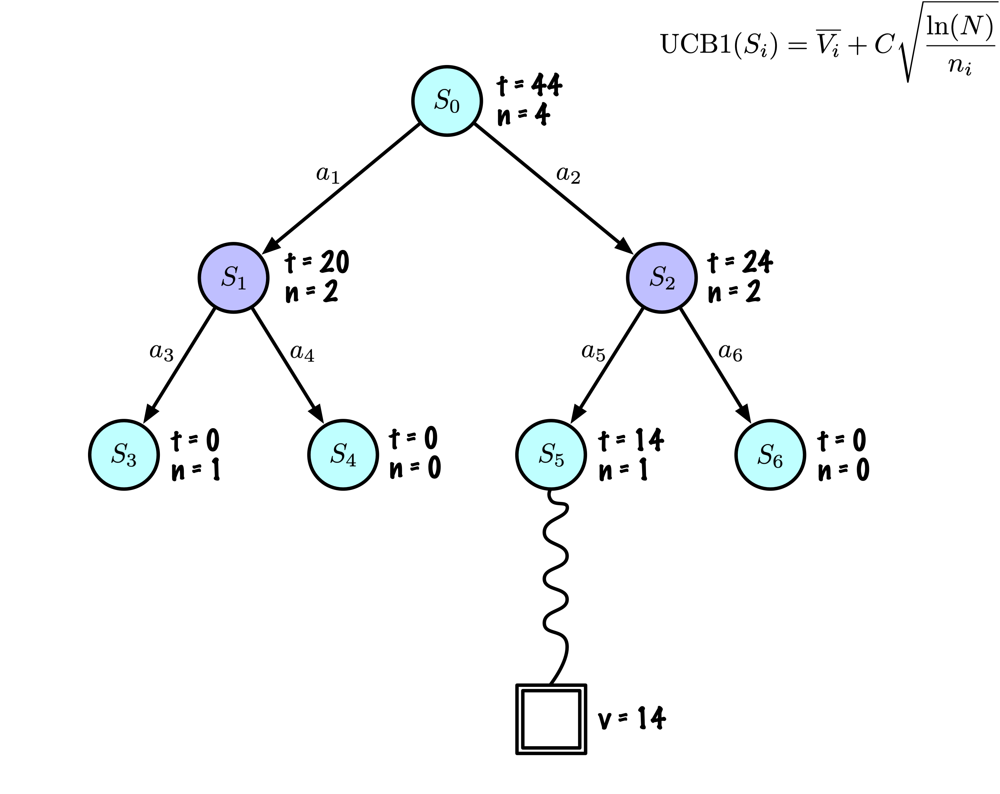

Adapted from: [Monte Carlo Tree Search](https://youtu.be/UXW2yZndl7U) by
John Levine posted on YouTube on 2017-03-06.

## Walk-through

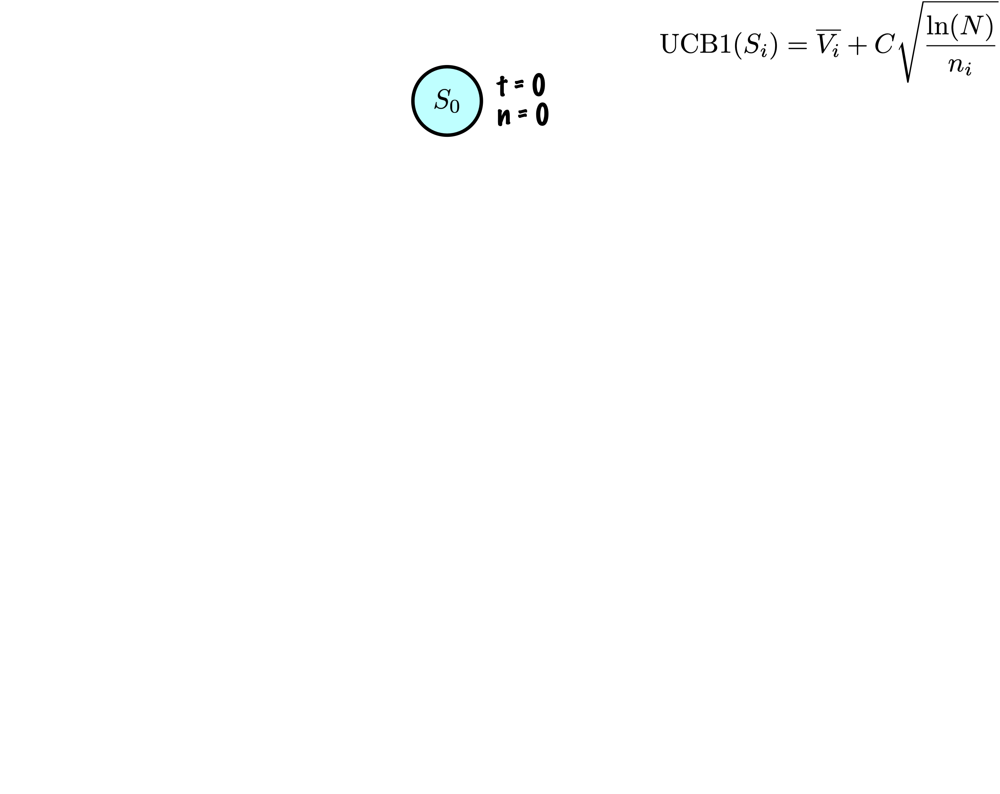

Each node keeps track of the number of visits ($n$) and a total score
($t$).

$S_0$ is the initial state.

## Walk-through

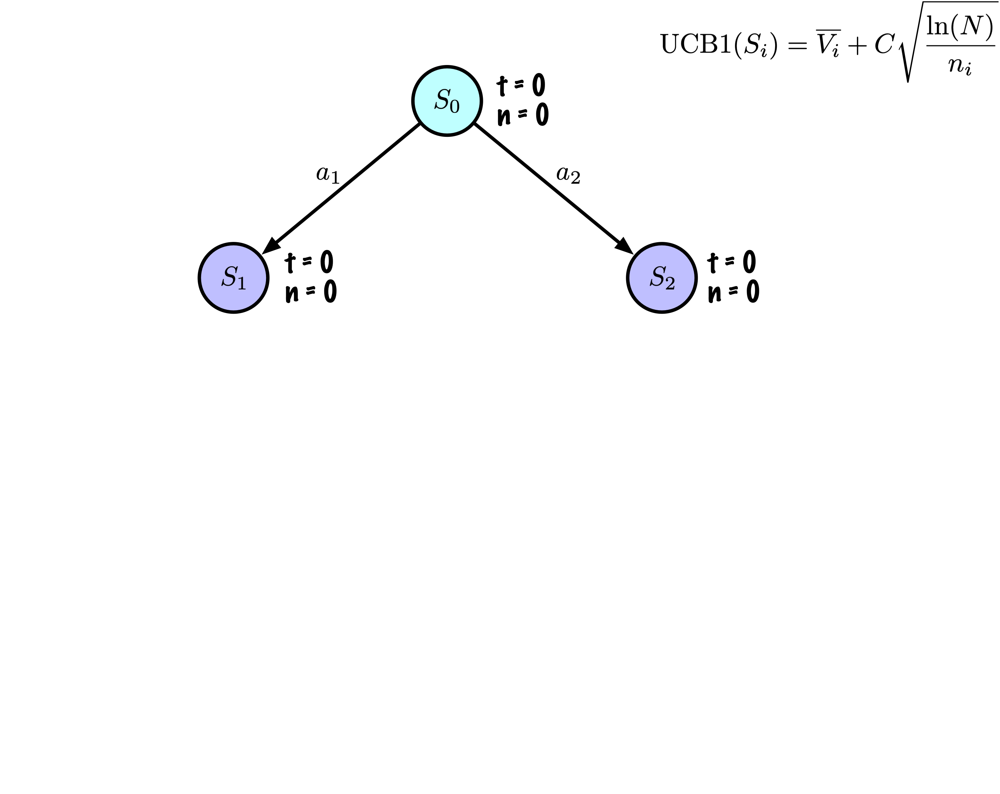

Adding the available actions, $a_1$ and $a_2$, as well as the
corresponding states, $S_1$ and $S_2$.

## Walk-through

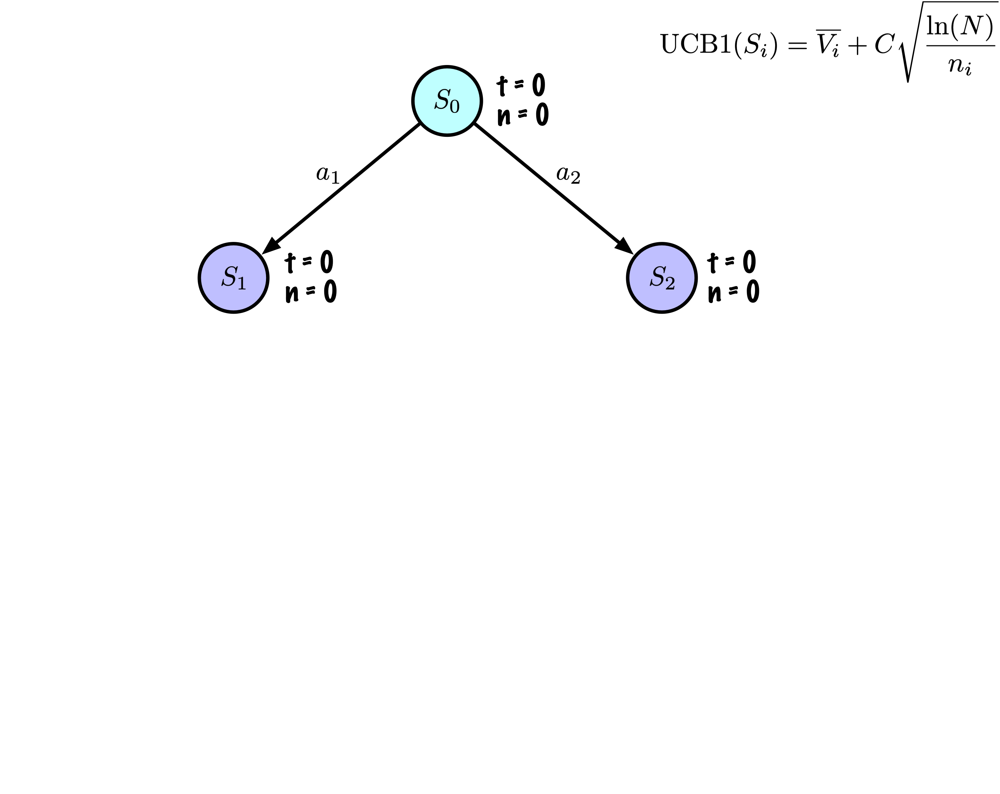

1.1 Start of the first iteration: Selection Step.

## Walk-through

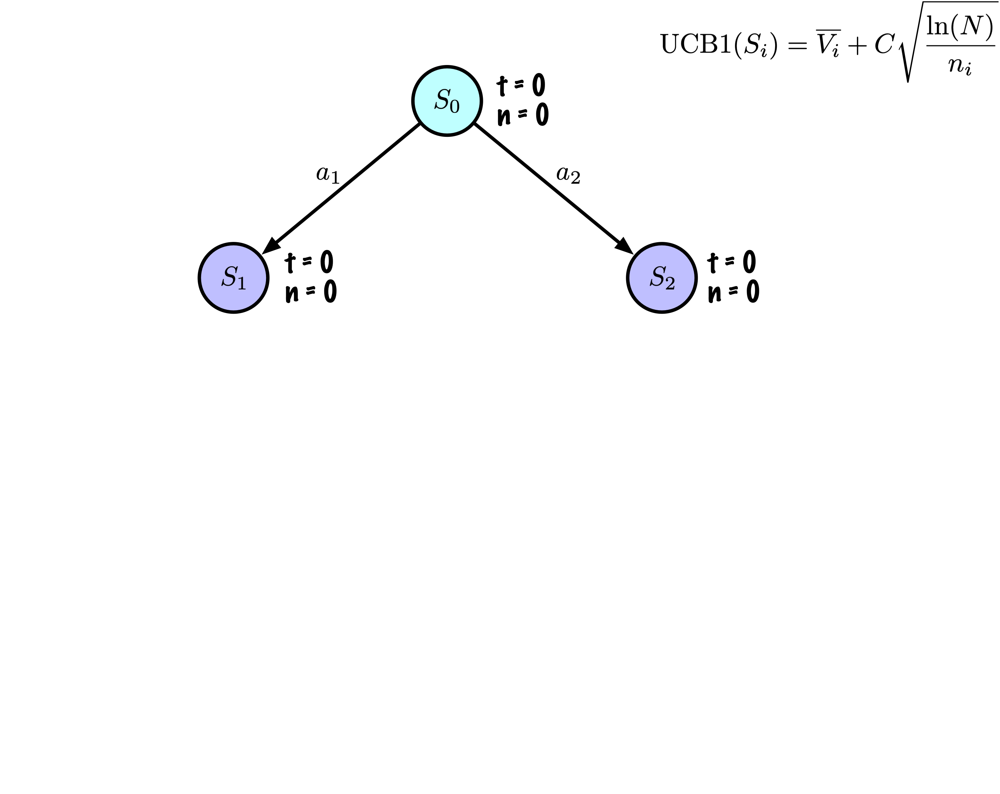

1.1 The UCB1 score of $S_1$ and $S_2$ are both $\infty$ since
$n_1 = n_2 = 0$.

We can select the either node.

## Walk-through

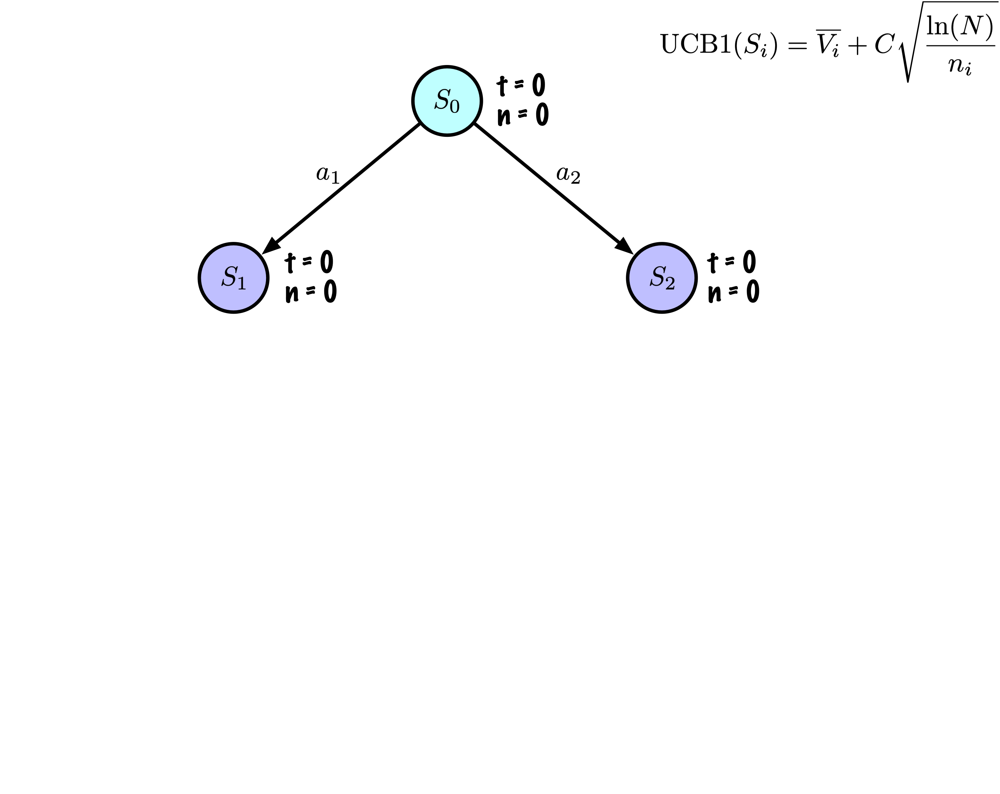

1.1 We reached a leaf node, $S_1$.

## Walk-through

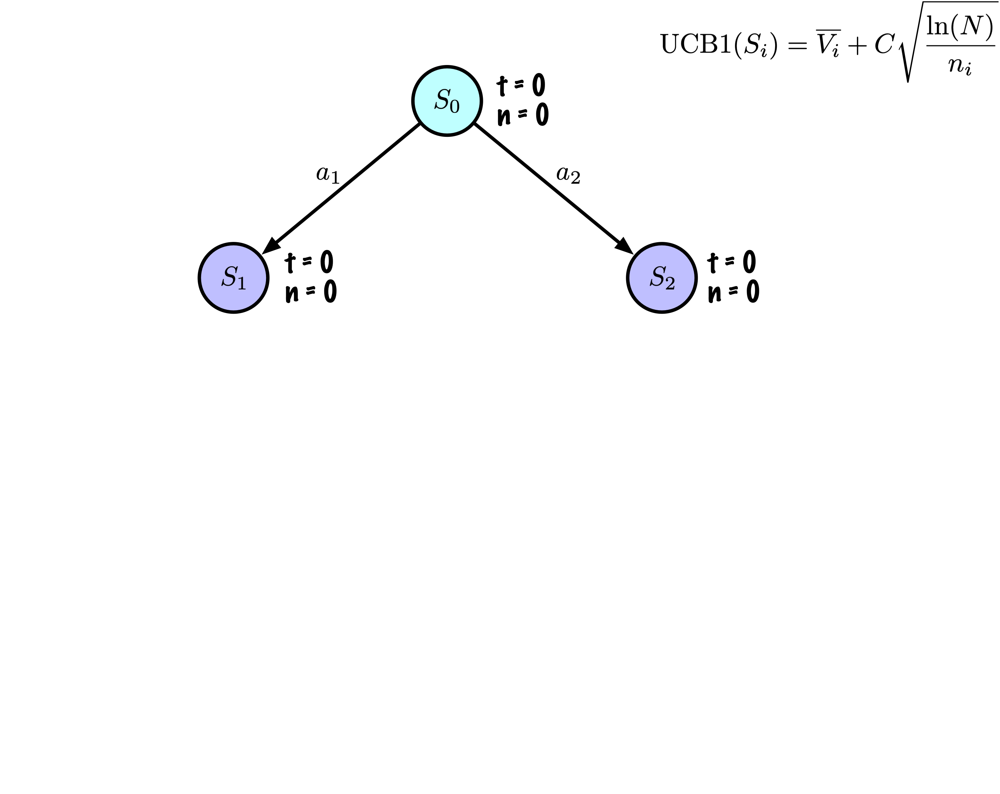

1.2 Node expansion. This node has not been visited yet. Therefore, no
expansion.

## Walk-through

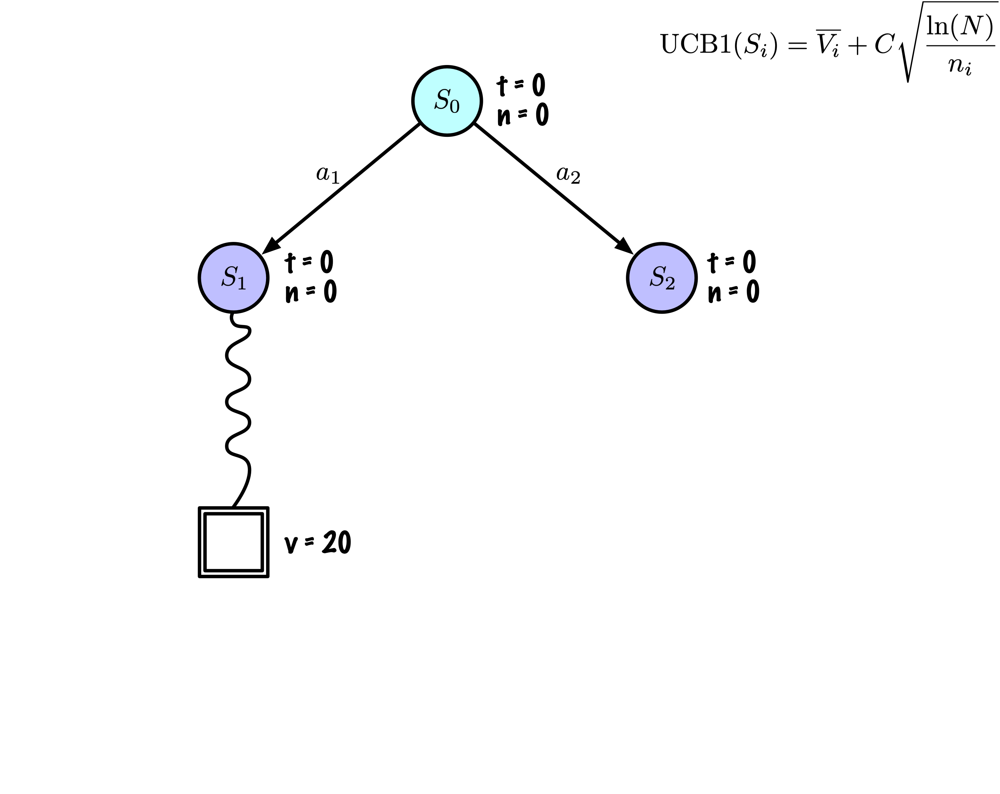

1.3 A rollout (simulation) is simply randomly selecting actions until a
terminal node is found.

## Walk-through

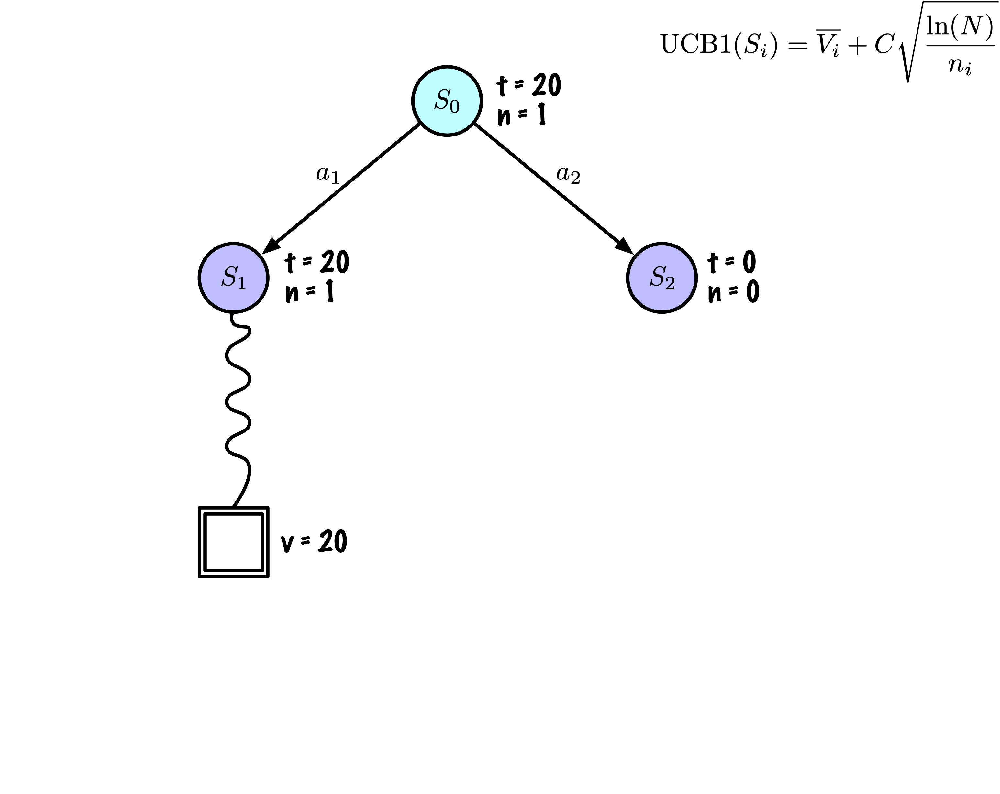

1.4 Back-propagation.

## Walk-through

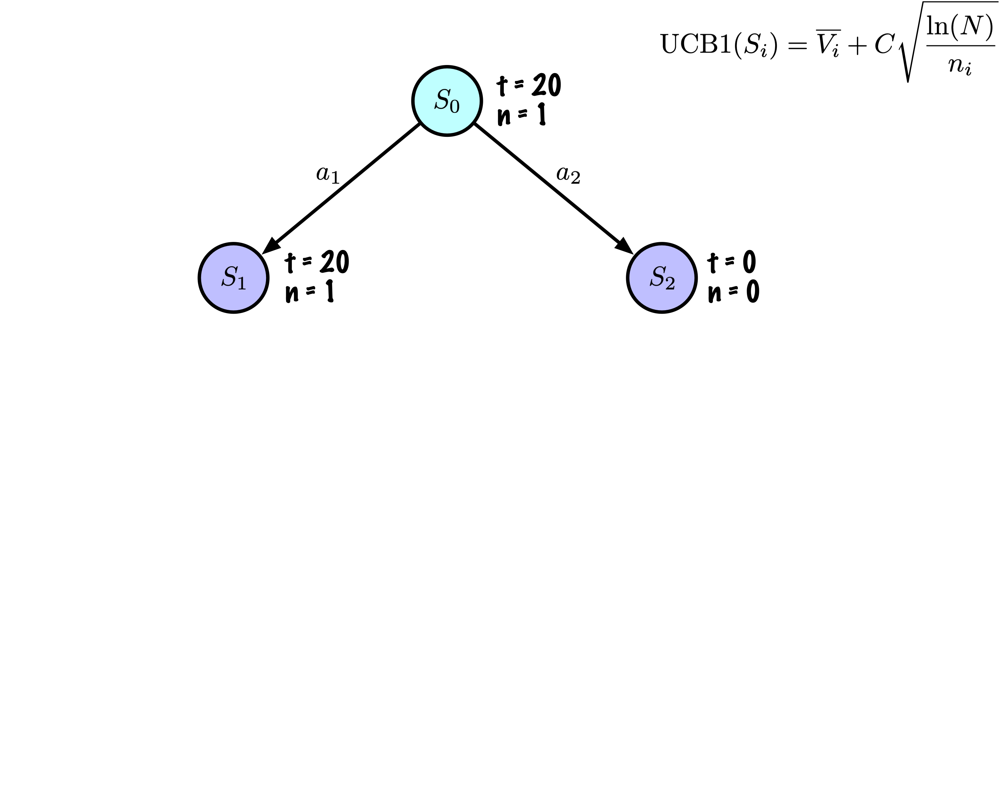

End of iteration 1.

## Walk-through

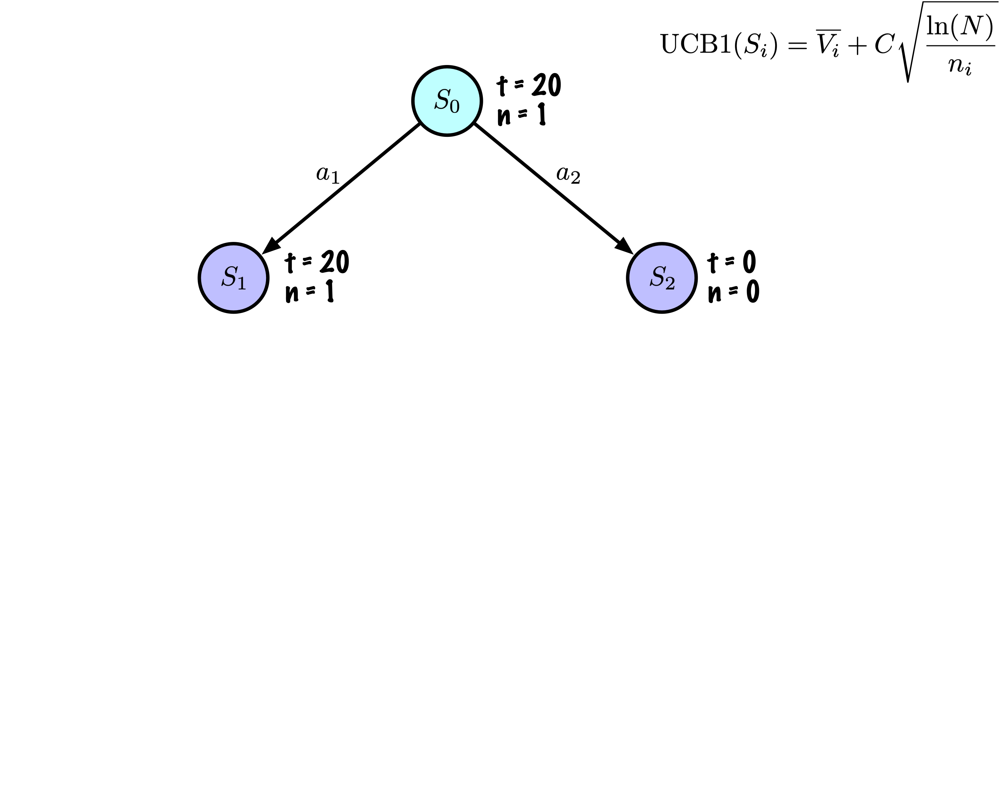

2.1 Selection. Computing the UCB1 value of
$S_1 = 20 + 2 \sqrt{\frac{\ln(1)}{1}}$ and $S_2  = \infty$.

We select $S_2$.

## Walk-through

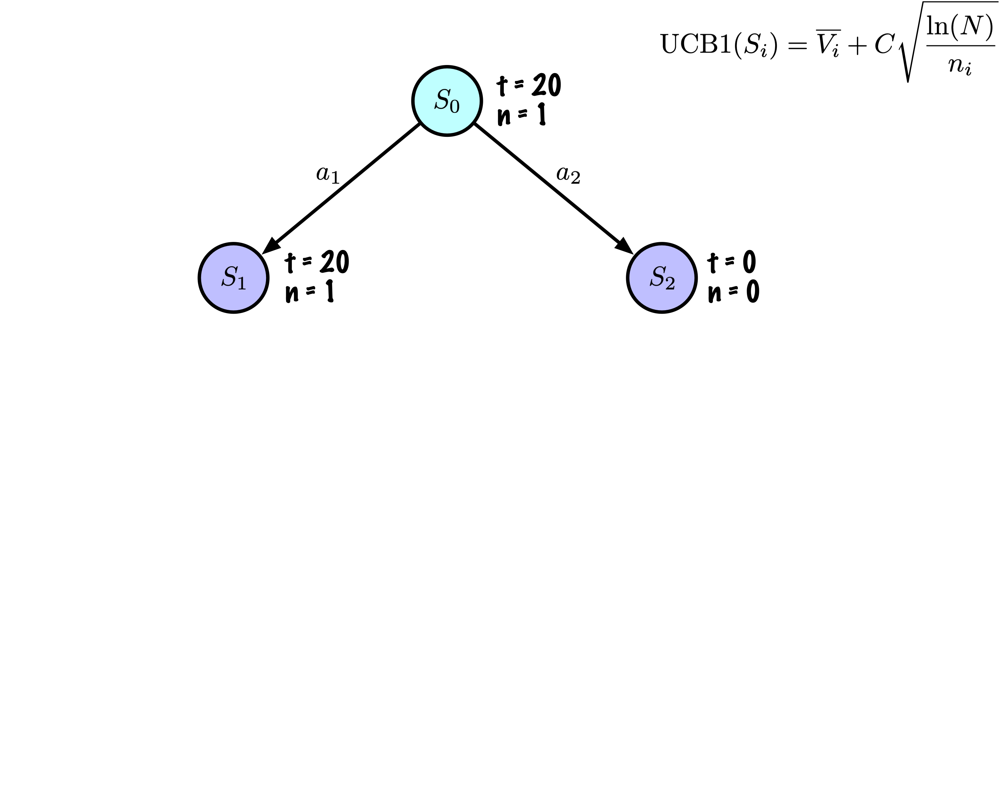

2.2 Expansion. This node has not been visited yet. Therefore, no
expansion.

## Walk-through

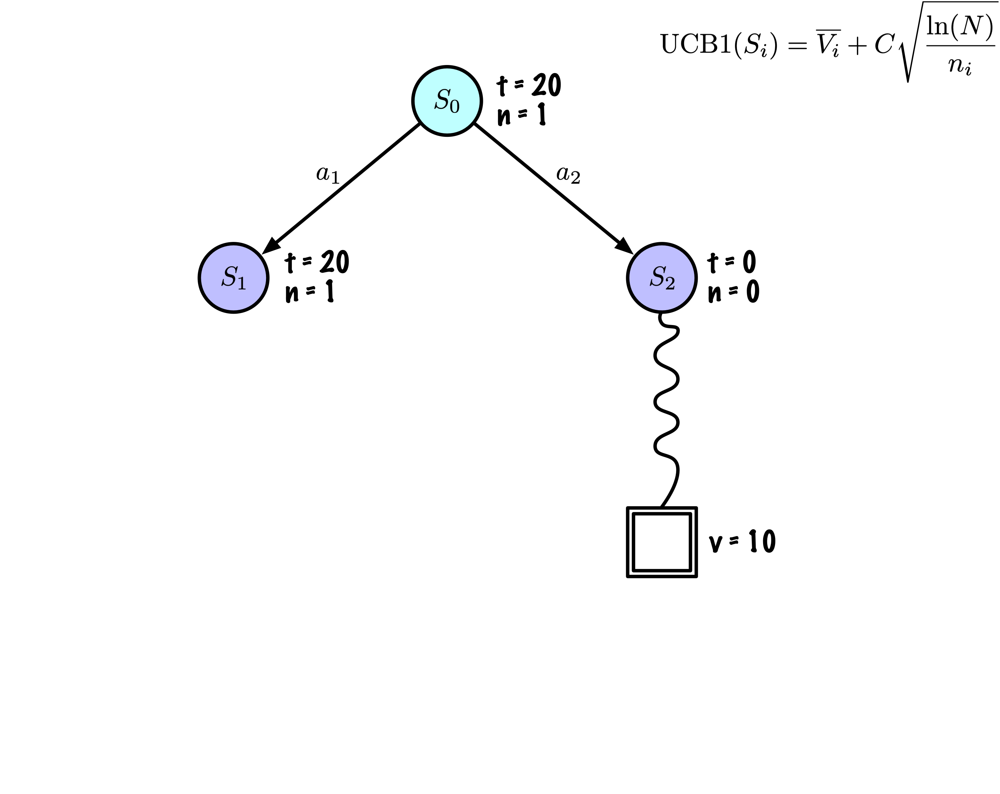

2.3 Rollout.

## Walk-through

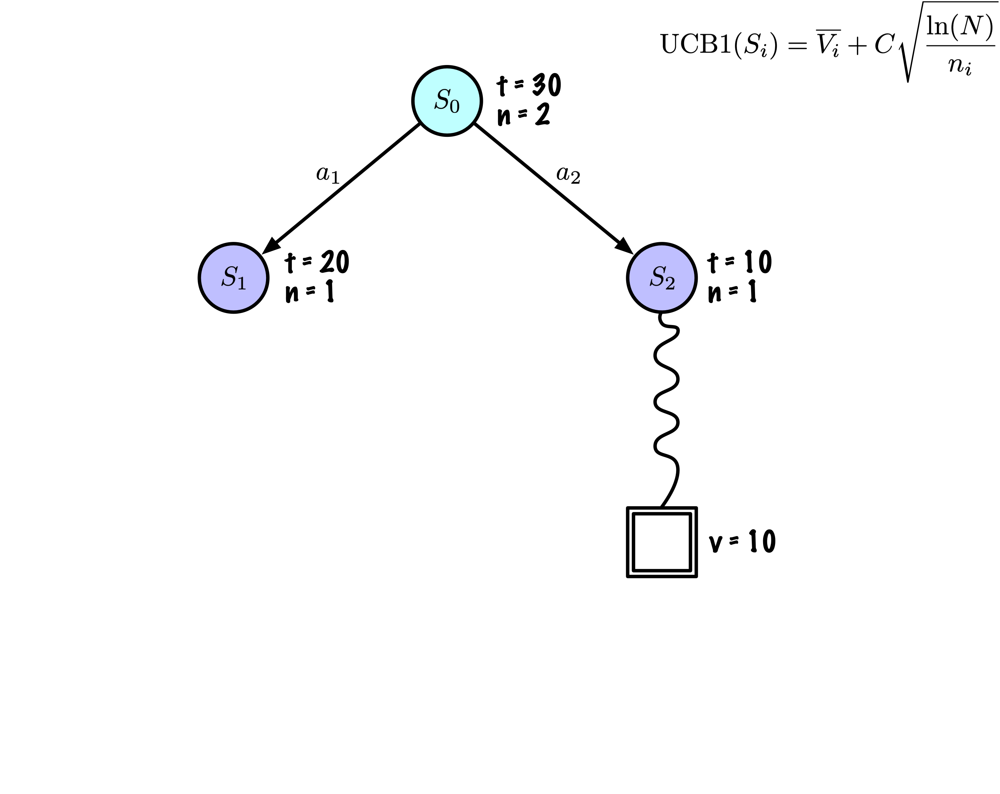

2.4 Back-propagation.

## Walk-through

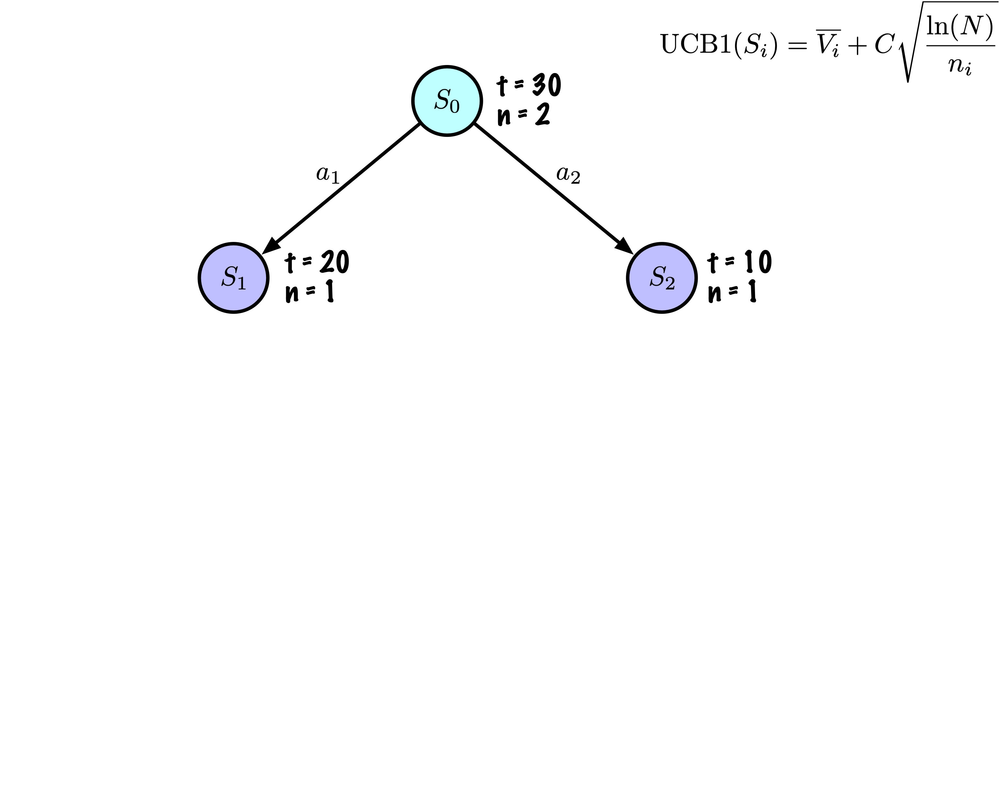

End of iteration 2.

## Walk-through

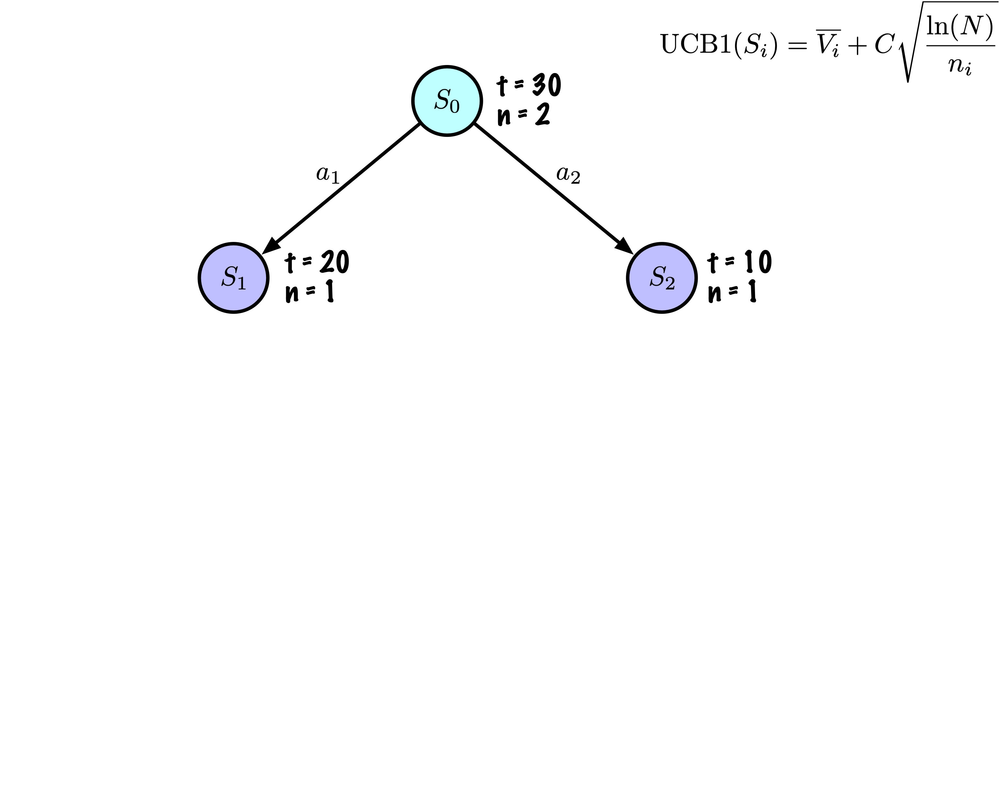

3.1 Selection. Calculating UCB1 values.

## Walk-through

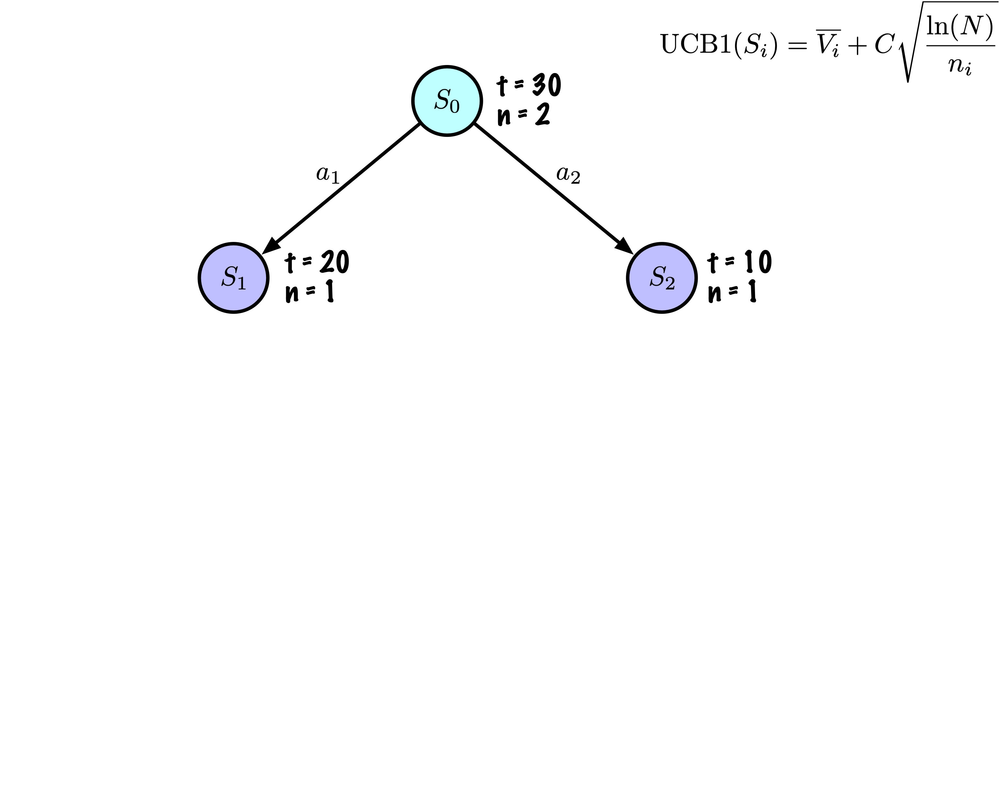

3.1 Selection.

Computing the UCB1 value of
$S_1 = 20 + 2 \sqrt{\frac{\ln(2)}{1}} = 21.67$ and
$S_2  = 10 + 2 \sqrt{\frac{\ln(2)}{1}} = 11.67$.

Selecting $S_1$

## Walk-through

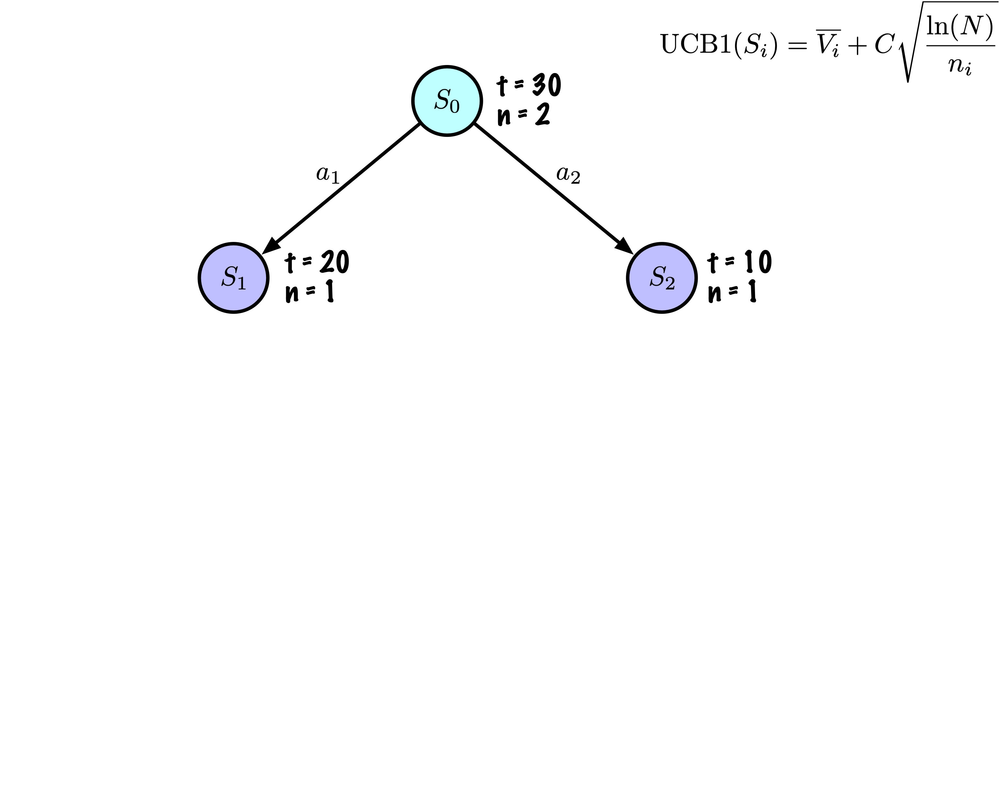

3.2 Node expansion.

## Walk-through

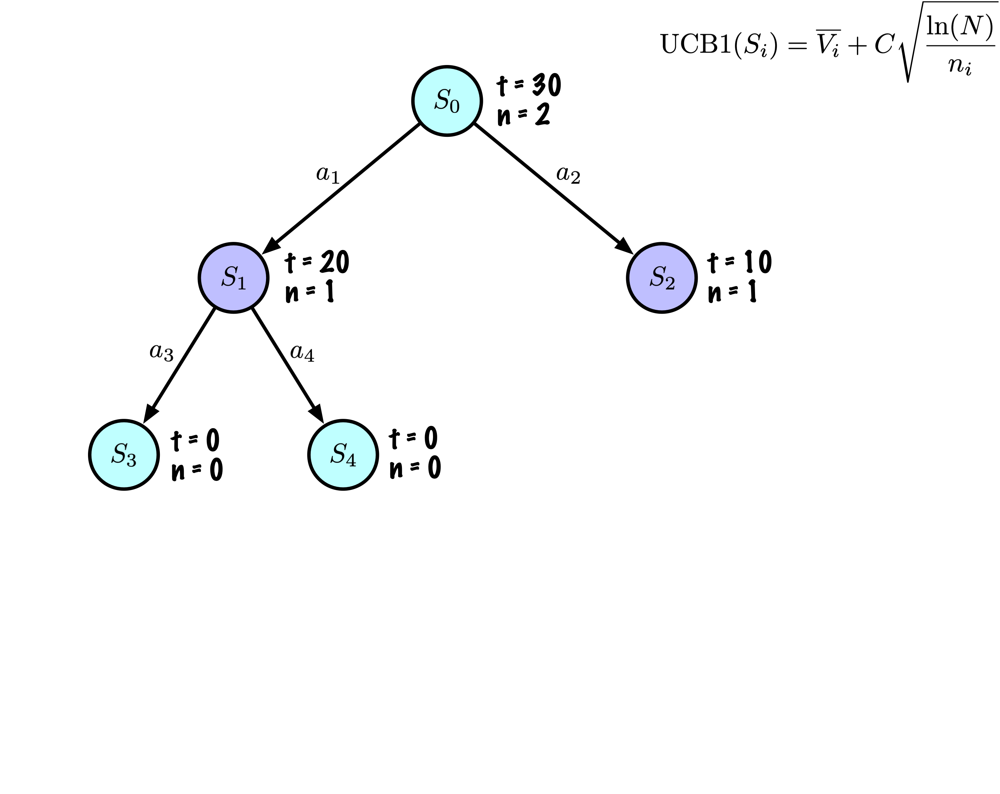

3.2 Node expansion. Since $n_1 \gt 0$, the node is expanded.

## Walk-through

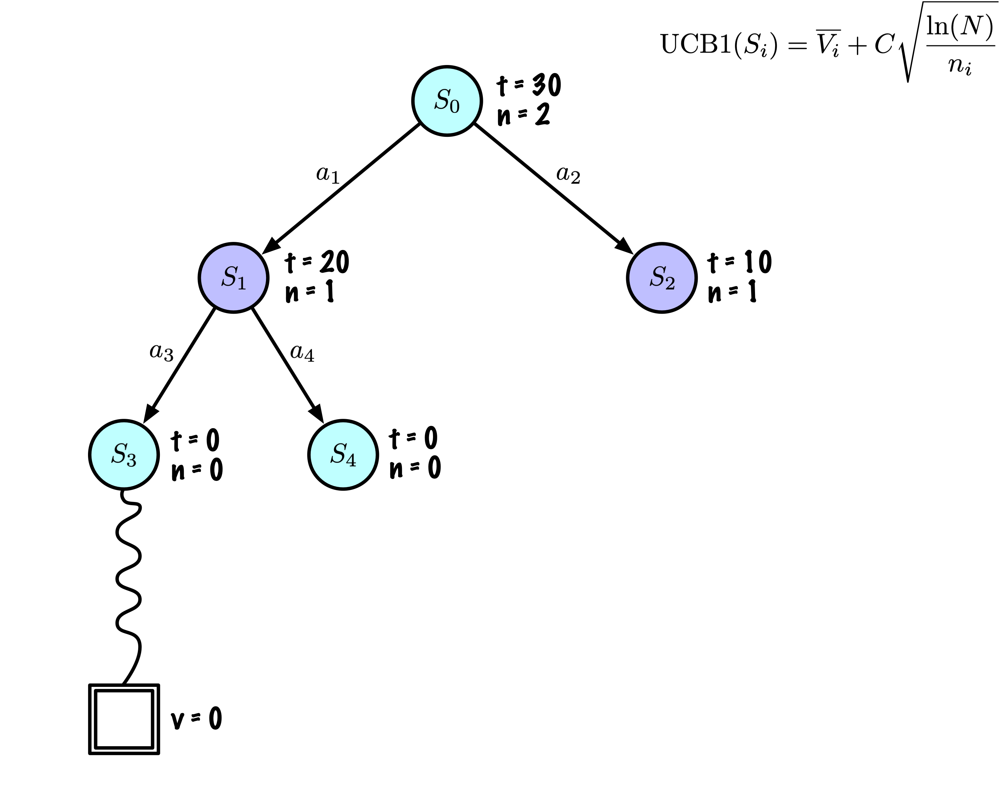

3.3 Rollout.

## Walk-through

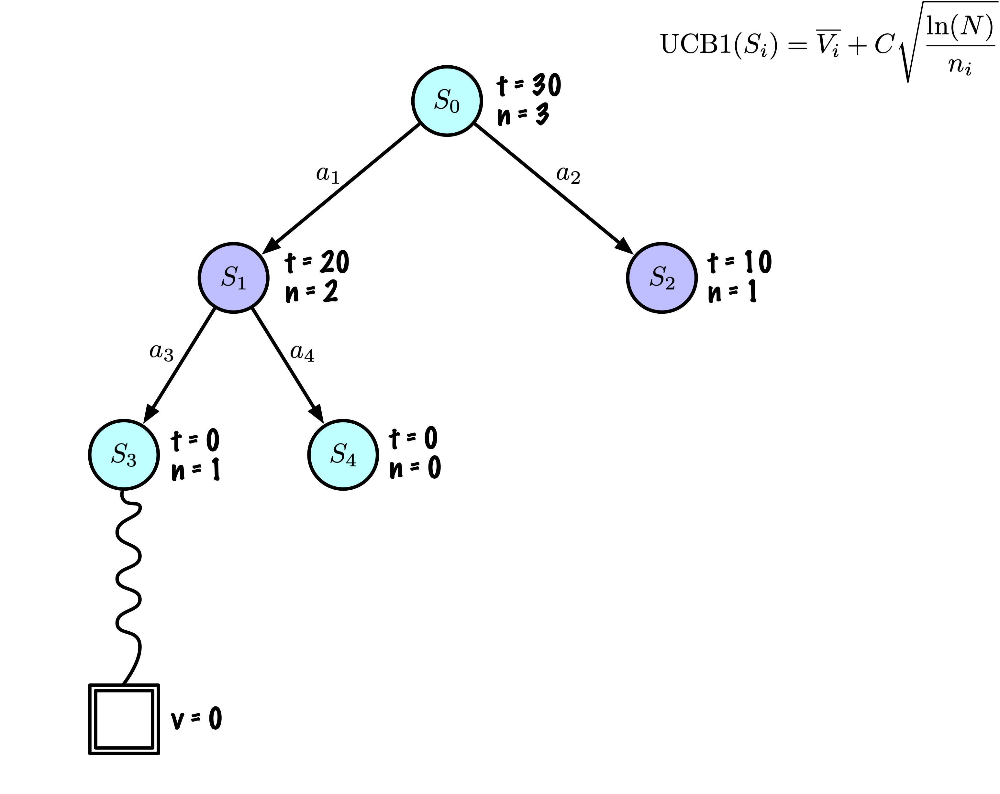

3.4 Back-propagation.

## Walk-through

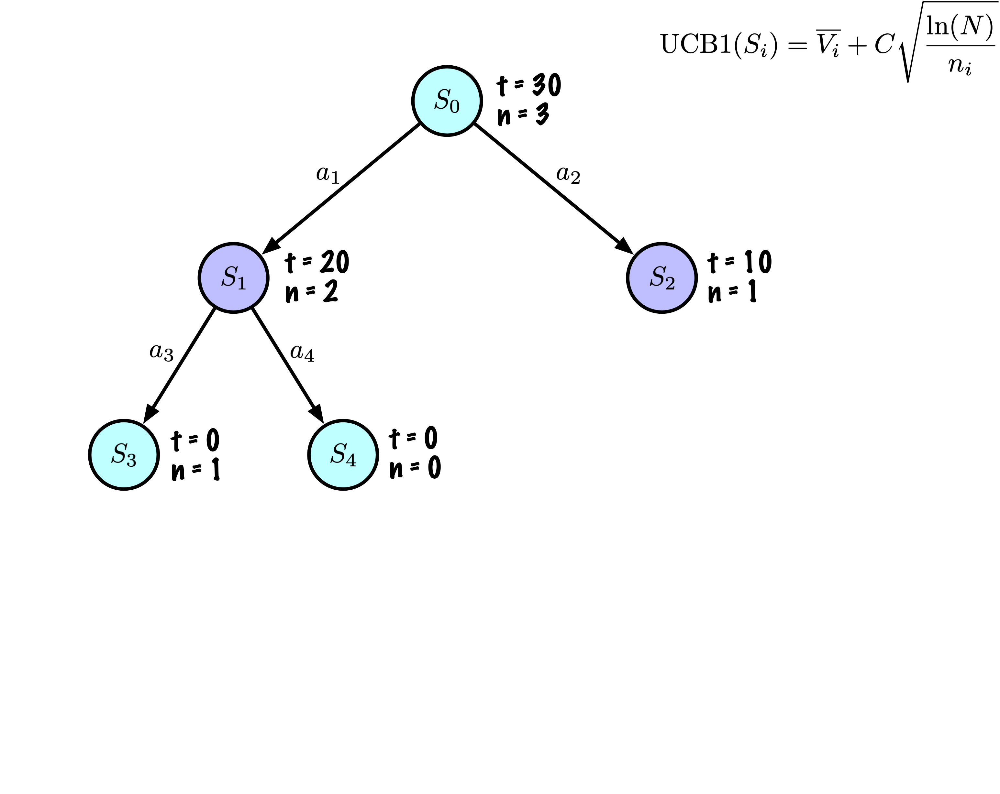

End of iteration 3.

## Walk-through

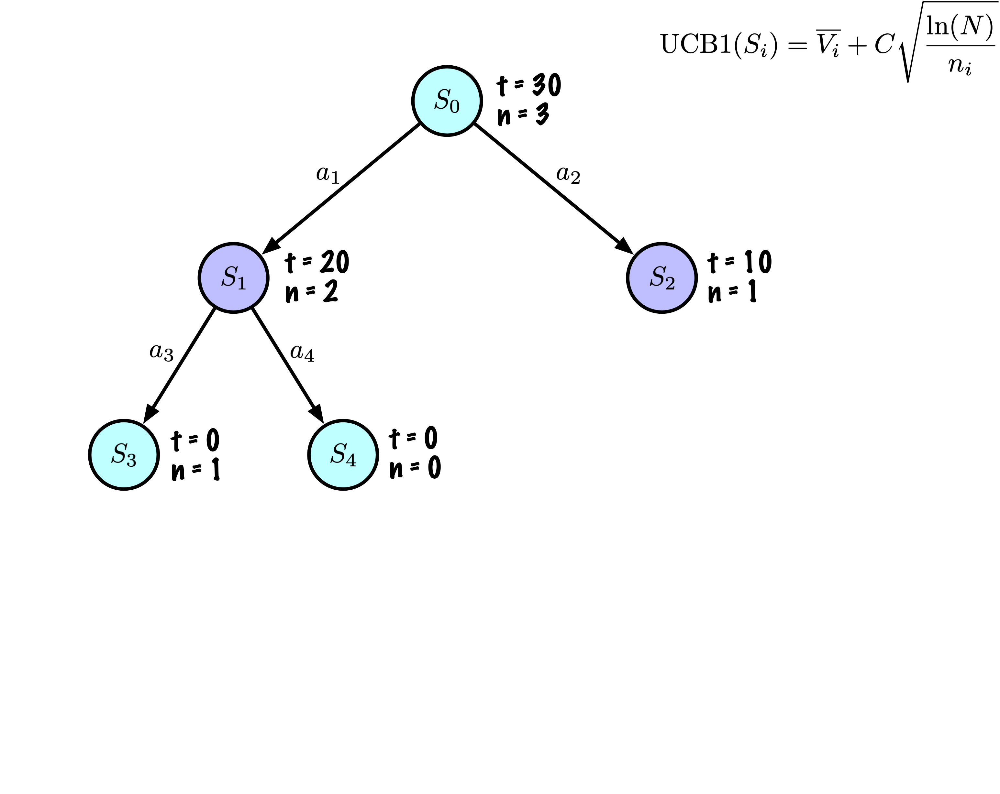

4.1 Selection. Calculating UCB1 values.

## Walk-through

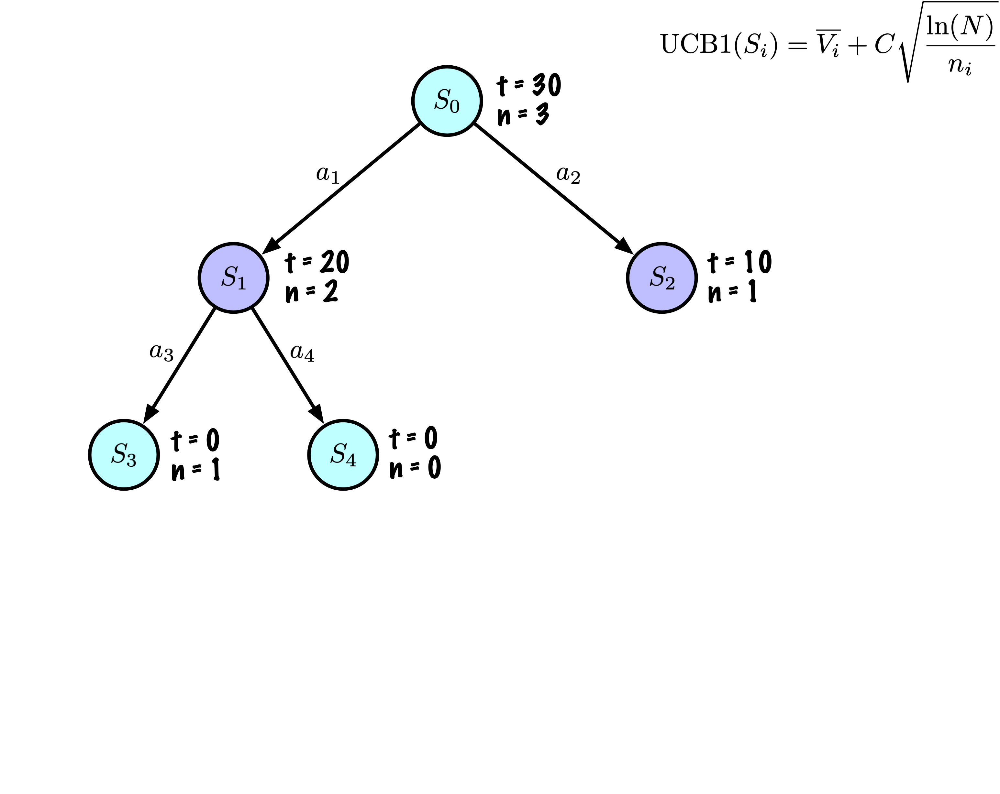

Computing the UCB1 value of
$S_1 = \frac{20}{2} + 2 \sqrt{\frac{\ln(3)}{2}} = 10 + 2 \sqrt{\frac{\ln(3)}{2}} = 11.48$
and $S_2  == 10 + 2 \sqrt{\frac{\ln(3)}{1}} = 12.10$.

Selecting $S_2$

## Walk-through

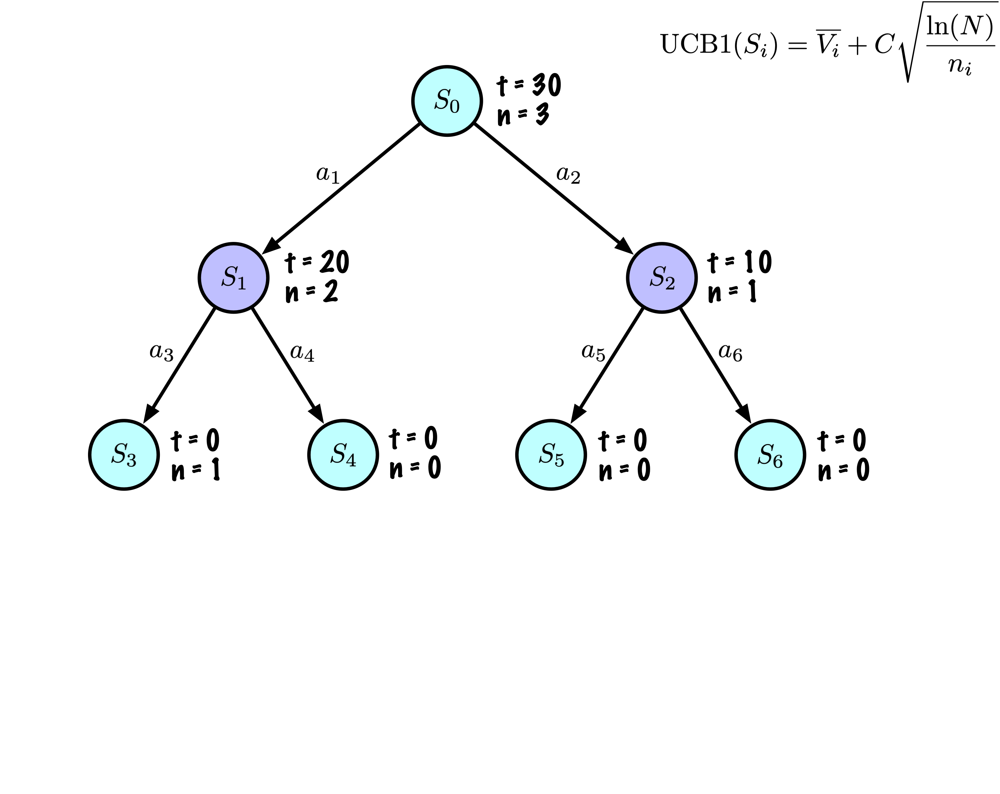

4.2 Expansion.

## Walk-through

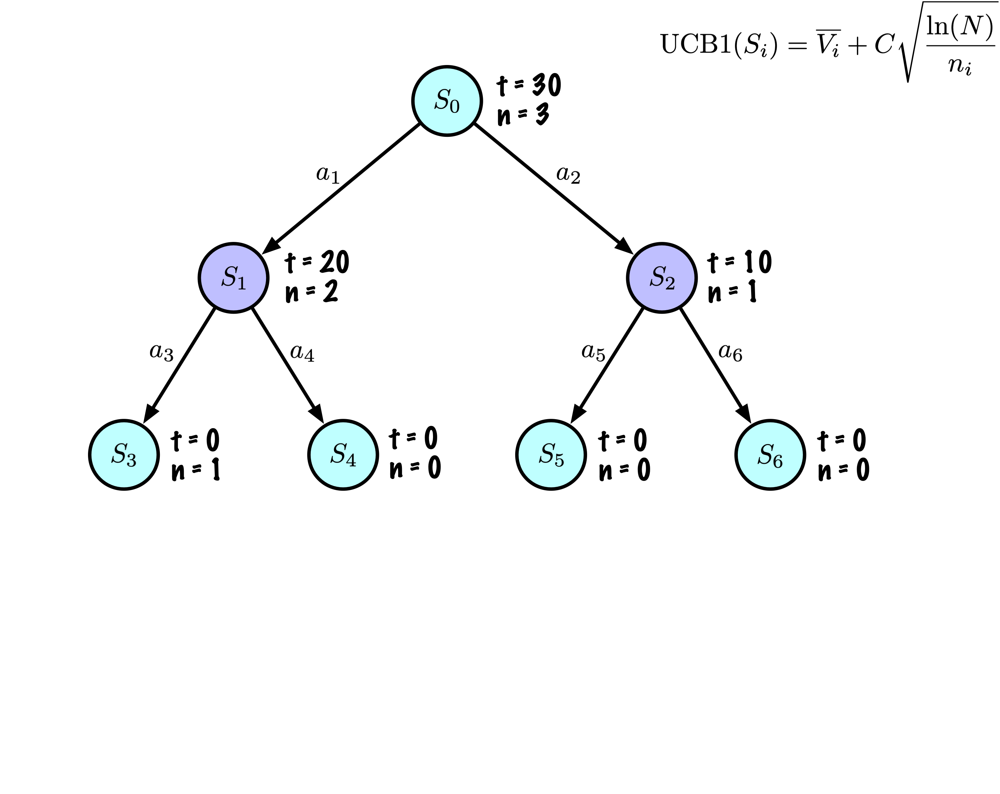

4.2 Expansion. Both nodes have the same USCB1 value, $\infty$.

Selecting $S_6$.

## Walk-through

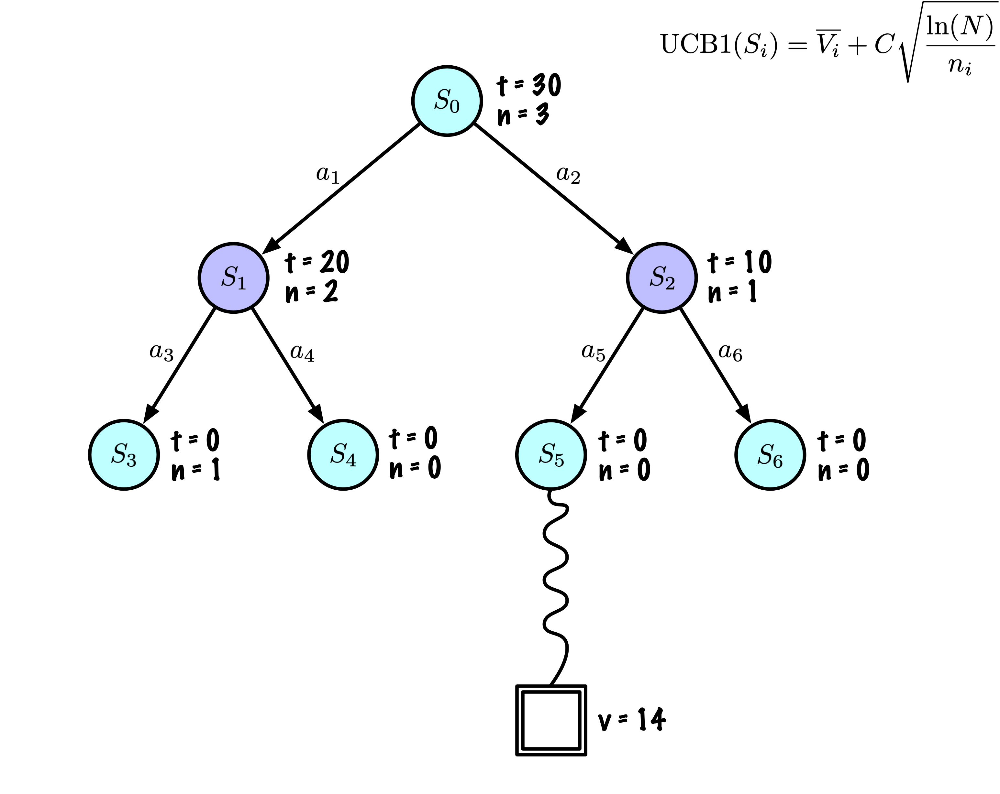

4.3 Rollout.

## Walk-through

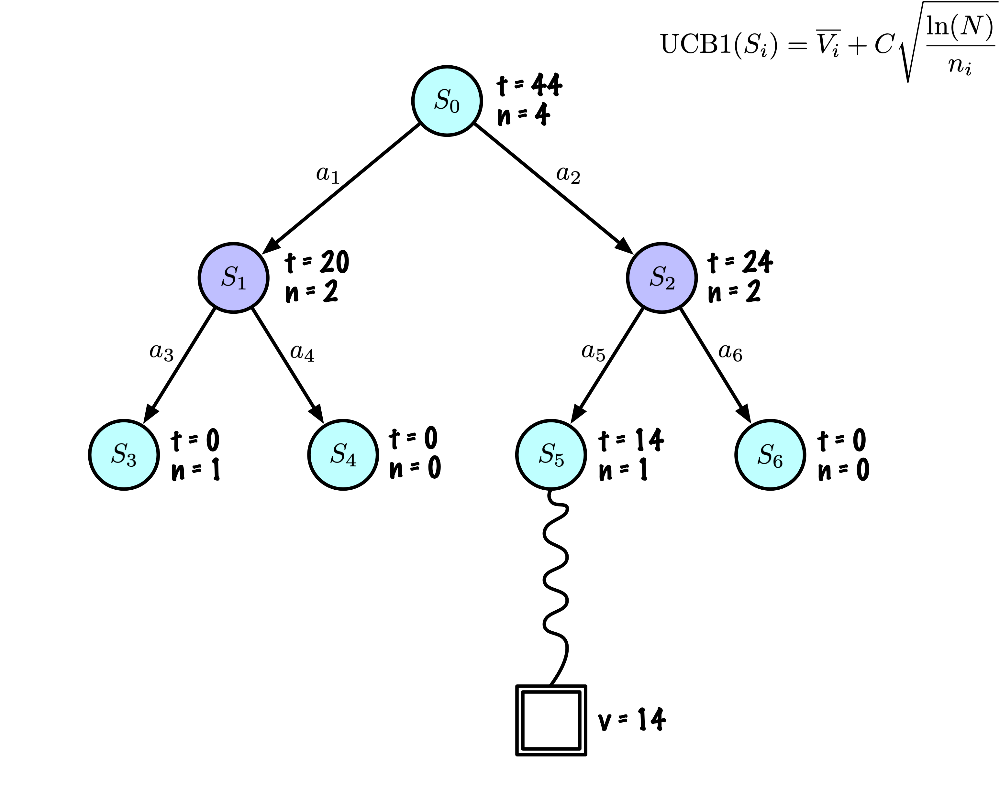

4.4 Back-propagation.

## Walk-through

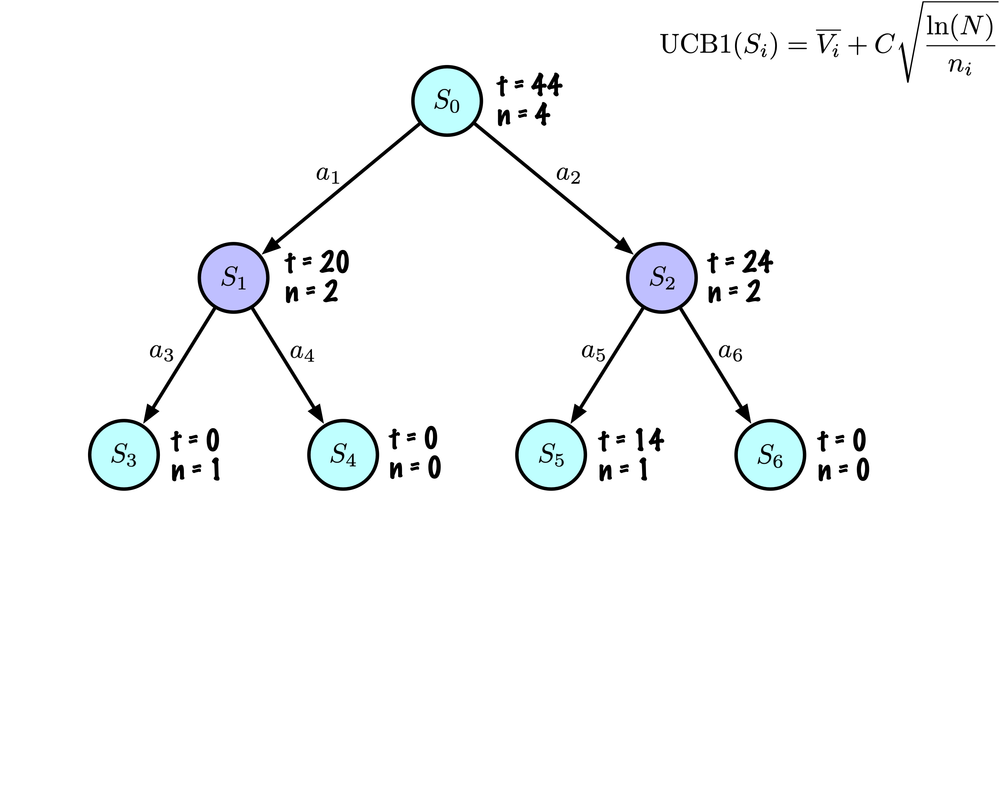

End of iteration 4.

## Walk-through

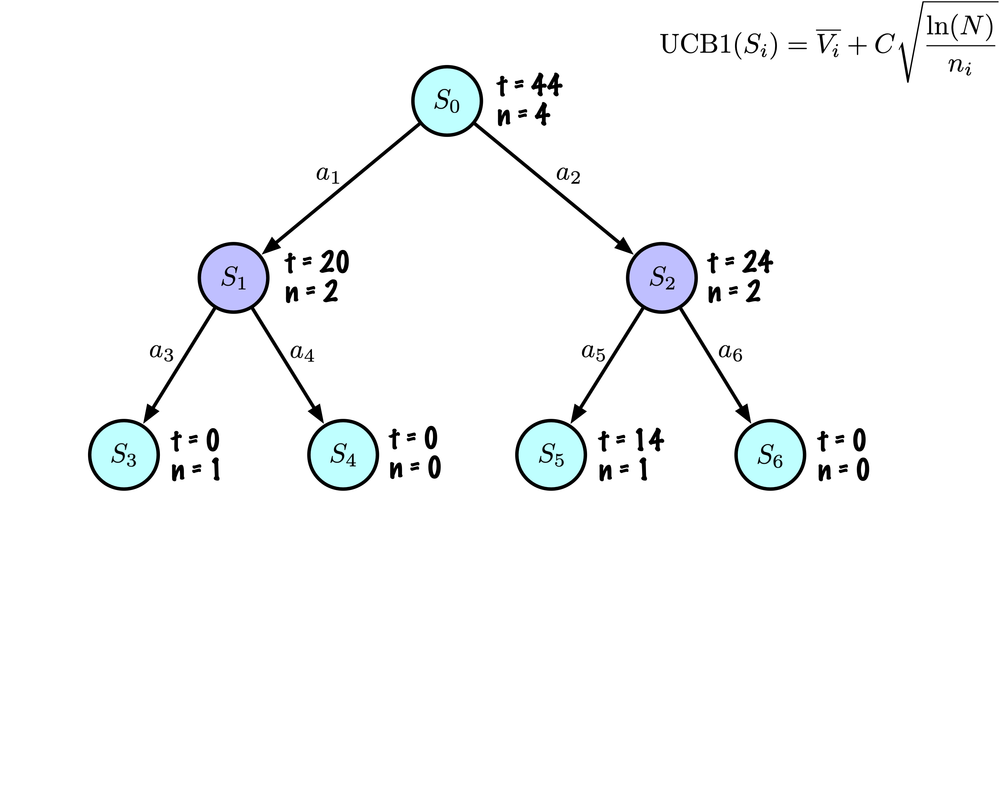

If the algorithm halts at this stage, it will recommend $a_2$ as the
optimal move, given that $S_2$ possesses the highest average score.

In applications such as chess, Go, or Atari games, MCTS conducts 1000 to
2000 simulations per move. This seemingly low count is attributed to the
use of deep learning algorithms, which direct the search through tree
and default policies.

Each set of iterations, for instance, 1000, is utilized solely to
determine the subsequent optimal move.

During the initial iterations, MCTS operates with limited information
for selecting the next best move. As iterations increase, the estimates
become more refined.

The number of nodes in a search tree after 1000 iterations of MCTS
depends on several factors, including the branching factor at each node
and the specific policy used for node expansion. Generally, each
iteration of MCTS consists of four main steps: selection, expansion,
simulation, and backpropagation. During the expansion phase, a new node
is added to the tree.

In a typical MCTS setup:

1.  **Selection**: Traverse the existing tree from the root to a leaf
    node using a tree policy, often based on Upper Confidence Bounds for
    Trees (UCT).
2.  **Expansion**: Add one or more child nodes to the selected node if
    it is not fully expanded.
3.  **Simulation**: Perform a simulation from the new node to a terminal
    state.
4.  **Backpropagation**: Update the value estimates of the traversed
    nodes based on the simulation result.

Assuming that each iteration expands exactly one new node, the search
tree will have approximately 1000 additional nodes after 1000
iterations. However, the actual number can vary if multiple nodes are
expanded per iteration or due to the tree’s initial setup and other
variations in the algorithm’s implementation.

## Russell and Norvig

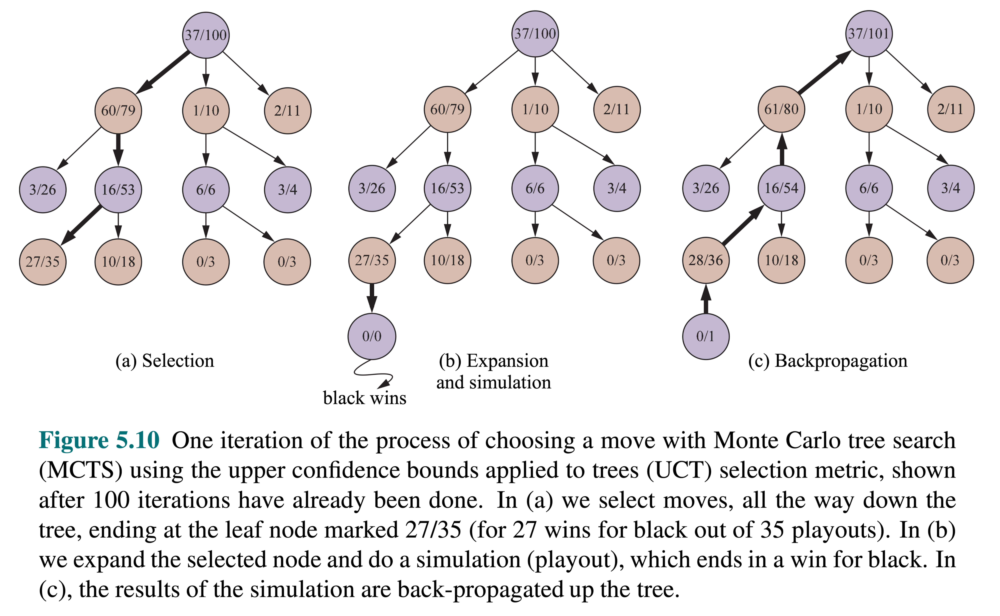

**Attribution**: Russell and Norvig (2020), Figure 5.10

This example includes a significantly larger number of nodes, which may
aid in comprehending the selection step more effectively.

The algorithm seeks to navigate toward the most promising area of the
tree, characterized by the highest average score, and subsequently
expands this section of the search tree.

Observe that the backpropagation step updates all nodes along the path
from the selected node to the root. This update can influence the path
chosen in the subsequent iteration.

## Summary (1)

Initially, the tree has one node, it is $S_0$.

We add its descendants and we are ready to start.

The Monte Carlo Tree Search slowly builds its search tree.

## Summary (2)

With each iteration, the following steps occur:

1.  **Selection**: Identify the optimal node by traversing a single path
    in the tree, guided by UCB1.

2.  **Expansion**: Expand the node if it is a leaf in the MCTS Tree and
    $n \gt 0$.

3.  **Rollout**: Simulate a game from the current state to a terminal
    state by randomly selecting actions.

4.  **Backpropagation**: Use the obtained information to update the
    current node and all parent nodes up to the root.

## Summary (3)

Each node records its total score and visit count.

This information is used to calculate a value that guides tree
traversal, balancing exploration and exploitation.

## Summary (4)

$$
\mathrm{UCB1}(S_i) = \overline{V_i} + C \sqrt{\frac{\ln(N)}{n_i}}
$$

The usual value for $C$ is $\sqrt{2}$.

Exploration essentially occurs when two nodes have approximately the
same average score, then MCTS favours nodes with fewer visits (dividing
by $n$).

For $n \lt \ln(N)$, the value of the ratio is greater than 1, whereas
for $n \gt \ln(N)$, the ratio becomes less than 1.

So there is a small fraction of the time where exploration kicks in. But
even then, the contribution of the ratio is quite tame, we’re taking the
square root of that ratio, multiplied by $\sqrt{2} \sim 1.414213562$.

## Summary (5)

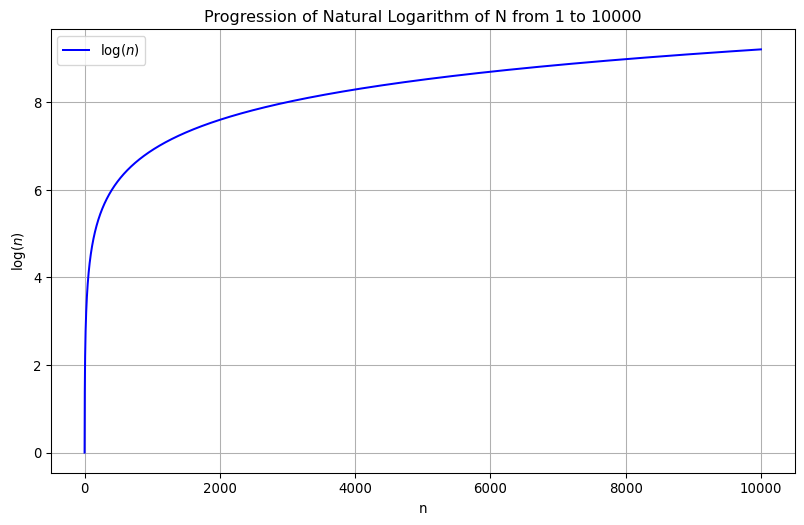

[4.60517019 6.90775528 9.21034037]

## Summary (5)

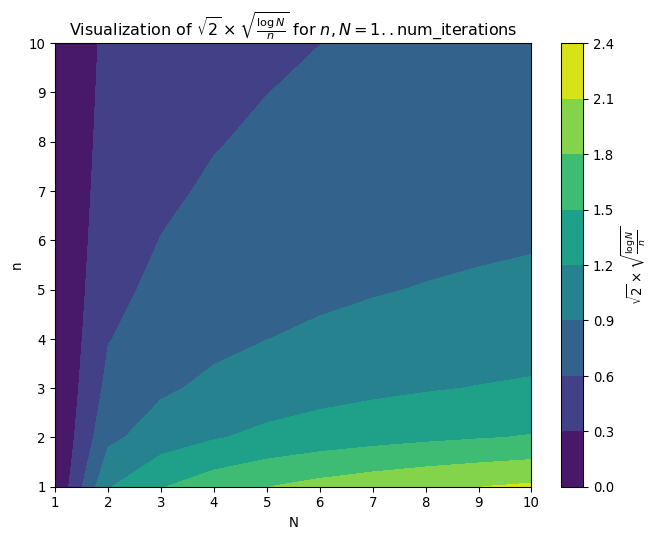

In [2]:
import numpy as np
import matplotlib.pyplot as plt

num_iterations = 10

# Define the range for n and N
n_values = np.arange(1, num_iterations + 1)
N_values = np.arange(1, num_iterations + 1)

# Prepare a meshgrid for n and N
N, n = np.meshgrid(N_values, n_values)

# Compute the expression for each pair (n, N)
Z = np.sqrt(2) * np.sqrt(np.log(N) / n)

# Plotting
plt.figure(figsize=(8, 6))
plt.contourf(N, n, Z, cmap='viridis')
plt.colorbar(label=r'$\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$')
plt.xlabel('N')
plt.ylabel('n')
plt.title(r'Visualization of $\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$ for $n, N = 1..\mathrm{num\_iterations}$')
plt.show()

## Summary (5)

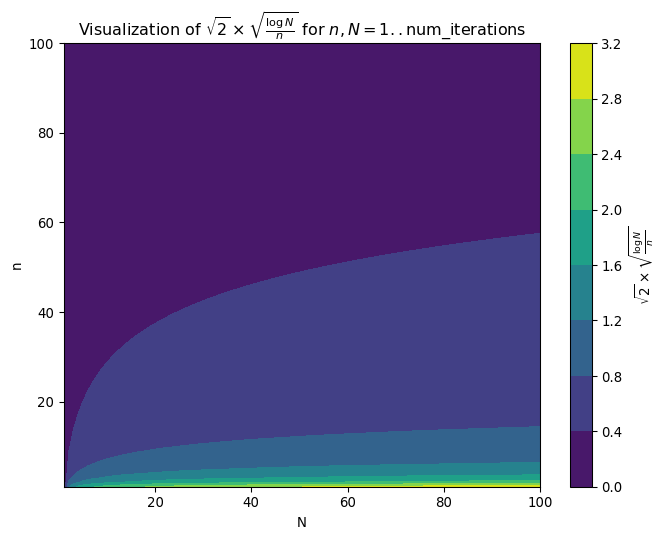

In [3]:
import numpy as np
import matplotlib.pyplot as plt

num_iterations = 100

# Define the range for n and N
n_values = np.arange(1, num_iterations + 1)
N_values = np.arange(1, num_iterations + 1)

# Prepare a meshgrid for n and N
N, n = np.meshgrid(N_values, n_values)

# Compute the expression for each pair (n, N)
Z = np.sqrt(2) * np.sqrt(np.log(N) / n)

# Plotting
plt.figure(figsize=(8, 6))
plt.contourf(N, n, Z, cmap='viridis')
plt.colorbar(label=r'$\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$')
plt.xlabel('N')
plt.ylabel('n')
plt.title(r'Visualization of $\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$ for $n, N = 1..\mathrm{num\_iterations}$')
plt.show()

**Origin of UCB1 in MCTS:**

The **Upper Confidence Bound 1 (UCB1)** formula originates from the
**multi-armed bandit problem**, a classic problem in reinforcement
learning and decision theory. In this problem, a gambler must decide
which arm of multiple slot machines to pull to maximize their total
reward, balancing the exploration of less-known machines and the
exploitation of machines known to provide high rewards.

The UCB1 algorithm was developed to address this
exploration-exploitation dilemma by providing a statistical upper bound
on the expected reward of each action (or arm). In the context of
**Monte Carlo Tree Search (MCTS)**, UCB1 is adapted to guide the
selection of nodes during the **Selection** phase, helping the algorithm
decide which node to explore next.

**Understanding the UCB1 Formula:**

The UCB1 formula used in MCTS is:

$$
\text{UCB1}(i) = \overline{X}_i + C \sqrt{\frac{\ln N}{n_i}}
$$

-   **$\overline{X}_i$**: The average reward (value) of node $i$
    (exploitation term).
-   **$C$**: A constant parameter that balances exploration and
    exploitation (commonly set to $\sqrt{2}$).
-   **$N$**: The total number of simulations or visits to the parent
    node.
-   **$n_i$**: The number of times node $i$ has been visited.

**Components Explained:**

1.  **Exploitation Term ($\overline{X}_i$)**: Represents the average
    reward obtained from node $i$, encouraging the selection of nodes
    with higher known rewards.

2.  **Exploration Term ($C \sqrt{\frac{\ln N}{n_i}}$)**: Provides a
    bonus to nodes that have been visited less frequently, encouraging
    the exploration of less-visited nodes.

**Balancing Exploration and Exploitation:**

-   **Exploitation**: Favors nodes with high average rewards.
-   **Exploration**: Favors nodes that have been visited less, to gather
    more information.

The **exploration term decreases as $n_i$ increases**, meaning that as a
node is visited more often, the incentive to explore it further
diminishes. Conversely, nodes with fewer visits receive a higher
exploration bonus.

**Why Exploration Occurs When Average Scores Are Similar:**

Here’s why:

-   **Similar Average Rewards ($\overline{X}_i$)**: When nodes have
    comparable exploitation values, the exploration term becomes the
    deciding factor in the UCB1 value.

-   **Influence of the Exploration Term**:

    -   **Less-Visited Nodes**: Have a higher exploration term due to
        smaller $n_i$, increasing their UCB1 value.
    -   **Well-Visited Nodes**: Have a lower exploration term, as $n_i$
        is larger.

-   **Result**: The algorithm is more likely to select less-explored
    nodes when the average rewards are similar, promoting exploration to
    potentially discover better outcomes.

**Mathematical Insight:**

-   When **$\overline{X}_i$ values are equal**, the UCB1 formula
    simplifies to comparing the exploration terms.
-   The node with the **smaller $n_i$** (less visited) will have a
    larger exploration term due to the $\frac{1}{\sqrt{n_i}}$
    relationship.
-   As **$N$** increases (more total simulations), the exploration bonus
    diminishes logarithmically, ensuring that the algorithm eventually
    favors exploitation.

**Visualizing the Exploration Term:**

To further understand how exploration is encouraged:

-   **Exploration Term Behavior**:
    -   **Early Stages ($n_i$ is small)**: Exploration term is
        significant, promoting the exploration of all nodes.
    -   **Later Stages ($n_i$ increases)**: Exploration term decreases,
        and nodes with higher average rewards are preferred.
-   **Logarithmic Growth**:
    -   The $\ln N$ term grows slowly, meaning that the exploration
        bonus reduces over time unless $n_i$ remains low.

**Conclusion:**

The UCB1 formula in MCTS effectively balances exploration and
exploitation by:

-   **Using the average reward** to exploit known good nodes.
-   **Incorporating the exploration term** to ensure that less-visited
    nodes are explored, especially when their average rewards are
    similar to others.
-   **Adapting over time**, so the algorithm initially explores widely
    but gradually focuses on the most promising nodes as more
    information is gathered.

**In summary**, the UCB1 formula originates from the need to solve the
exploration-exploitation dilemma in the multi-armed bandit problem and
is integral to MCTS’s ability to efficiently search large decision
spaces. The exploration primarily occurs when nodes have similar average
scores because the exploration term then plays a crucial role in
differentiating between them, guiding the algorithm to potentially
unexplored but promising areas of the search space.

**Additional Resources:**

-   **Research Papers**:
    -   Auer, P., Cesa-Bianchi, N., & Fischer, P. (2002). *Finite-time
        Analysis of the Multiarmed Bandit Problem*. Machine Learning.
    -   Kocsis, L., & Szepesvári, C. (2006). *Bandit Based Monte-Carlo
        Planning*. ECML.
-   **Further Reading**:
    -   [Monte Carlo Tree Search
        Tutorial](https://jeffbradberry.com/posts/2015/09/intro-to-monte-carlo-tree-search/)
    -   [Understanding UCB1 and
        MCTS](https://www.baeldung.com/cs/monte-carlo-tree-search)

## Tic-tac-toe

In [5]:
# Game class for Tic-Tac-Toe
class TicTacToe:
    def __init__(self):
        # Initialize the 3x3 board with empty spaces
        self.size = 3
        self.board = np.full((self.size, self.size), ' ')

    def get_valid_moves(self, state):
        """
        Return a list of available positions on the board.
        """
        moves = [(i, j) for i in range(self.size) for j in range(self.size) if state[i][j] == ' ']
        return moves

    def make_move(self, state, move, player):
        """
        Place the player's symbol on the board at the specified move.
        Return the new state.
        """
        new_state = state.copy()
        new_state[move[0], move[1]] = player
        return new_state

    def get_opponent(self, player):
        """
        Return the opponent of the given player.
        """
        return 'O' if player == 'X' else 'X'

    def is_terminal(self, state):
        """
        Check if the game has ended, either by win or draw.
        """
        return self.evaluate(state) != 0 or ' ' not in state

    def evaluate(self, state):
        """
        Evaluate the board state.
        Return:
            1 if 'X' wins,
            -1 if 'O' wins,
            0 otherwise (draw or ongoing game).
        """
        lines = []

        # Rows and columns
        for i in range(self.size):
            lines.append(state[i, :])      # Row i
            lines.append(state[:, i])      # Column i

        # Diagonals
        lines.append(np.diag(state))
        lines.append(np.diag(np.fliplr(state)))

        # Check for a winner
        for line in lines:
            if np.all(line == 'X'):
                return 1
            elif np.all(line == 'O'):
                return -1

        # No winner
        return 0

    def display(self, state):
        """
        Print the board to the console.
        """
        print("\nCurrent board:")
        for i in range(self.size):
            row = '|'.join(state[i])
            print(row)
            if i < self.size - 1:
                print('-' * (self.size * 2 - 1))

## `Node`

In [6]:
# Node class for MCTS
class Node:
    def __init__(self, state, parent=None, move=None, player='X'):
        self.state = state            # Game state at this node
        self.parent = parent          # Parent node
        self.children = []            # List of child nodes
        self.visits = 0               # Number of times node has been visited
        self.wins = 0                 # Number of wins from this node
        self.move = move              # Move that led to this node
        self.player = player          # Player who made the move

    def is_fully_expanded(self, game):

        """
        Check if all possible moves from this node have been explored.
        """

        return len(self.children) == len(game.get_valid_moves(self.state))

    def best_child(self, c_param=math.sqrt(2)):

        """
        Select the child node with the highest UCB1 value.
        """

        choices_weights = []
        for child in self.children:
            if child.visits == 0:
                ucb1 = float('inf')
            else:
                win_rate = child.wins / child.visits
                exploration = c_param * math.sqrt((2 * math.log(self.visits)) / child.visits)
                ucb1 = win_rate + exploration
            choices_weights.append(ucb1)

        return self.children[np.argmax(choices_weights)]

    def most_visited_child(self):

        """
        Select the child node with the highest visit count.
        """

        visits = [child.visits for child in self.children]
        return self.children[np.argmax(visits)]

## `mcts`

In [7]:
# MCTS Algorithm
def mcts(game, root, iterations):

    for _ in range(iterations):
        node = tree_policy(game, root)
        reward = default_policy(game, node.state, node.player)
        backup(node, reward)

    return root.most_visited_child()

def tree_policy(game, node):

    """
    Selection and Expansion phases.
    """

    while not game.is_terminal(node.state):
        if not node.is_fully_expanded(game):
            return expand(game, node)
        else:
            node = node.best_child()

    return node

def expand(game, node):

    """
    Expand a child node from the current node.
    """

    tried_moves = [child.move for child in node.children]
    possible_moves = game.get_valid_moves(node.state)

    for move in possible_moves:
        if move not in tried_moves:
            next_state = game.make_move(node.state, move, node.player)
            child_node = Node(state=next_state, parent=node, move=move, player=game.get_opponent(node.player))
            node.children.append(child_node)
            return child_node

def default_policy(game, state, player):

    """
    Simulation phase: play out the game randomly from the given state.
    """

    current_state = state.copy()
    current_player = player

    while not game.is_terminal(current_state):
        possible_moves = game.get_valid_moves(current_state)
        move = random.choice(possible_moves)
        current_state = game.make_move(current_state, move, current_player)
        current_player = game.get_opponent(current_player)

    result = game.evaluate(current_state)

    return result

def backup(node, reward):

    """
    Backpropagation phase: update the node statistics.
    """

    while node is not None:
        node.visits += 1
        # Update wins. If the result is a win for the player who just played, add 1.
        if (node.player == 'X' and reward == 1) or (node.player == 'O' and reward == -1):
            node.wins += 1
        elif reward == 0:
            node.wins += 0.5  # Consider draw as half win
        node = node.parent

## `test_tic_tac_toe_mcts`

In [8]:
# Main function to demonstrate the application
def test_tic_tac_toe_mcts():

    game = TicTacToe()
    current_state = game.board.copy()
    current_player = 'X'
    root_node = Node(state=current_state, player=current_player)

    while not game.is_terminal(current_state):

        game.display(current_state)
        print(f"Player {current_player}'s turn.")

        if current_player == 'X':
            # AI's turn using MCTS
            iterations = 1000  # Adjust as needed
            best_child = mcts(game, root_node, iterations)
            current_state = best_child.state
            root_node = best_child
        else:
            # Human player's turn
            possible_moves = game.get_valid_moves(current_state)
            print("Possible moves:", possible_moves)
            move = None
            while move not in possible_moves:
                try:
                    move_input = input("Enter your move as 'row,col': ")
                    move = tuple(int(x.strip()) for x in move_input.split(','))
                except:
                    print("Invalid input. Please enter row and column numbers separated by a comma.")
            current_state = game.make_move(current_state, move, current_player)
            # Update the tree: find or create the child node corresponding to the move
            matching_child = None
            for child in root_node.children:
                if child.move == move:
                    matching_child = child
                    break
            if matching_child:
                root_node = matching_child
            else:
                root_node = Node(state=current_state, parent=None, move=move, player=game.get_opponent(current_player))
        # Switch player
        current_player = game.get_opponent(current_player)

    # Game over
    game.display(current_state)
    result = game.evaluate(current_state)
    if result == 1:
        print("X wins!")
    elif result == -1:
        print("O wins!")
    else:
        print("It's a draw!")

if __name__ == "__main__":
    test_tic_tac_toe_mcts()

## Exploration

-   Implement code to visualize the search tree, either as text or using
    Graphviz.

-   Incorporate heuristics to detect when a winning move is achievable
    in a single step.

-   Experiment with varying the number of iterations and the constant
    $C$.

# Prologue

## Summary

-   Monte Carlo Tree Search (MCTS) is a search algorithm used for
    decision-making in complex games.
-   MCTS operates through four main steps: Selection, Expansion, Rollout
    (Simulation), and Backpropagation.
-   It balances exploration and exploitation using the UCB1 formula,
    which guides node selection based on visit counts and scores.
-   MCTS maintains an explicit search tree, updating node values
    iteratively based on simulations.
-   The algorithm has wide-ranging applications, including AI gaming,
    drug design, circuit routing, and autonomous driving.
-   Introduced in 2008, MCTS gained prominence with its use in AlphaGo
    in 2016.
-   Unlike traditional algorithms like $A^\star$, MCTS uses dynamic
    policies and leverages all visited nodes for decision-making.
-   Implementing MCTS involves tracking node statistics and applying the
    UCB1 formula to guide search.
-   A practical example of MCTS is demonstrated through implementing
    Tic-Tac-Toe.
-   Further exploration includes integrating MCTS with deep learning
    models like AlphaZero and MuZero.

## Further exploration

-   [JAX-native environment for
    simulations](https://github.com/sotetsuk/pgx)
-   [AlphaZero](https://deepmind.google/discover/blog/alphazero-shedding-new-light-on-chess-shogi-and-go/)
-   [MuZero](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/)
-   [Gumbel](https://openreview.net/forum?id=bERaNdoegnO)
-   [MCTS Tic-Tac-Toe with
    Visualization](https://github.com/kevinzhangftw/Monte-Carlo-Tree-Search-Tic-Tac-Toe/tree/master)

## The End

-   Consult the course website for information on the final examination.

## References

Chaslot, Guillaume, Sander Bakkes, Istvan Szita, and Pieter Spronck.
2008. “<span class="nocase">Monte-Carlo Tree Search: a new framework for
game AI</span>.” In *Proceedings of the Fourth AAAI Conference on
Artificial Intelligence and Interactive Digital Entertainment*, 216–17.
AIIDE’08. Stanford, California: AAAI Press.

Kemmerling, Marco, Daniel Lütticke, and Robert H. Schmitt. 2024. “Beyond
Games: A Systematic Review of Neural Monte Carlo Tree Search
Applications.” *Applied Intelligence* 54 (1): 1020–46.
<https://doi.org/10.1007/s10489-023-05240-w>.

Russell, Stuart, and Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4th ed. Pearson. <http://aima.cs.berkeley.edu/>.

Silver, David, Aja Huang, Chris J. Maddison, Arthur Guez, Laurent Sifre,
George van den Driessche, Julian Schrittwieser, et al. 2016.
“<span class="nocase">Mastering the game of Go with deep neural networks
and tree search</span>.” *Nature* 529 (7587): 484–89.
<https://doi.org/10.1038/nature16961>.

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

School of Electrical Engineering and **Computer Science** (EE**CS**)

University of Ottawa